In [1]:
import diplib as dip
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

DIPlib -- a quantitative image analysis library
Version 3.4.1 (Oct 13 2023)
For more information see https://diplib.org


In [2]:
mask_list = []

In [3]:
measurament_list = []

In [4]:
blue_area_list =[]

In [5]:
def segmentation(img):
    image = dip.ImageRead(img)
    x = np.array(image)
    r_channel = x[:, :, 0]
    g_channel = x[:, :, 1]
    b_channel = x[:, :, 2]
    r_image = dip.Image(r_channel)
    g_image = dip.Image(g_channel)
    b_image = dip.Image(b_channel)
    r_image_sm = dip.Gauss(r_image,5)
    b_image_sm = dip.Gauss(b_image, 5)
    b_mask = dip.OtsuThreshold(r_image_sm)
    b_img_otsu_sm = dip.OtsuThreshold(b_image_sm)
    d = dip.EdgeObjectsRemove(b_mask)
    b_mask = dip.Label(d, minSize=7700)
    b_mask = dip.Invert(b_mask)
    b_img_otsu_sm = dip.EdgeObjectsRemove(b_img_otsu_sm)
    b_img_otsu_sm = dip.FillHoles(b_img_otsu_sm)
    b_img_otsu_sm = dip.Label(b_img_otsu_sm, minSize=10000)
    inv_mask = dip.Invert(b_img_otsu_sm)
    mask_list.append(b_img_otsu_sm)
    s = inv_mask-b_mask
    s = dip.Invert(s)
    seg = dip.OtsuThreshold(s)
    x_seg = np.array(seg)
    blue_area = np.sum(seg)
    blue_area_list.append(blue_area)
    return b_img_otsu_sm

## Segmentation strategy

We use the blue channel because it is the one where there's the better contrast between the embrio and the background.
Converting the image to grey tones do not help because the illumination is not optimal and we obtain uncompleted shapes of the
embryos.
We smooth the blue channel and apply Otsu thresholding method, removing eventual objects touching the edge and noisy pixels.
If needed we also fill holes inside the embrio shape.
At the same time we also compute the size of the blue pixels, which correlate with the expression of the target gene.
In this case we use the red channel, where the expression spots are represented by darker tones.
We smooth the image and then apply the otsu thresholding. In this case, darker regions are seen as background by the the algorithm
and we obtain a mask for the object which miss the parts that are expressing the target gene.
We subtract from the whole image mask this other mask and the difference are the parts that only express the target gene.
We then compute size of those part (Absolute gene expression), and then we divide this area for the total area of the embryo (relative gene expression)

In [6]:
def measurament(original_image,mask):
    original_image = dip.ColorSpaceManager.Convert(original_image,"grey")
    m = dip.MeasurementTool.Measure(mask,original_image,['Size' , 'Perimeter' , 'Roundness','StandardDeviation',"Statistics"])
    measurament_list.append(m)
    return m

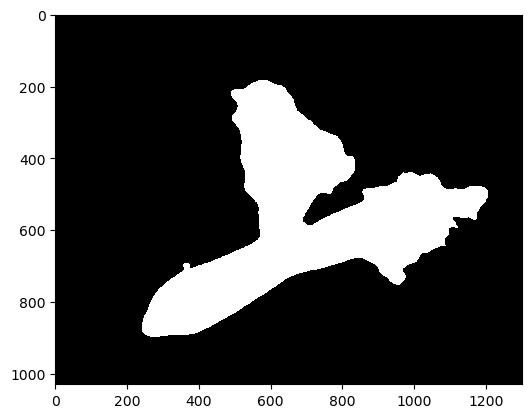

In [7]:
image_1_mask = segmentation('w8t1t2_d7_01')
image_1_mask.Show()

In [8]:
image_1 = dip.ImageRead('w8t1t2_d7_01')
img_1_meas = measurament(image_1,image_1_mask)

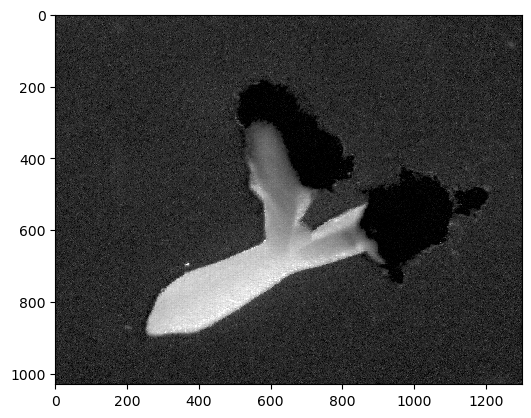

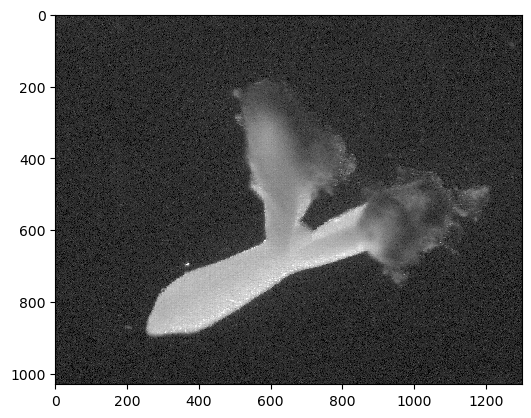

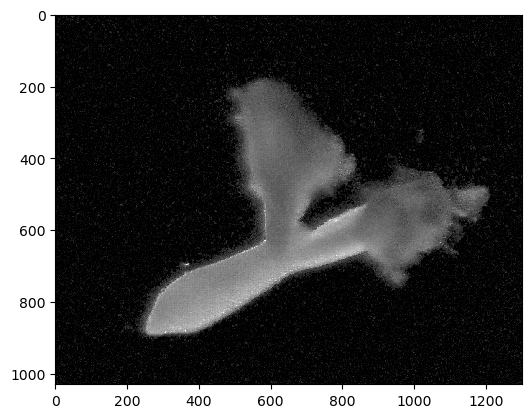

In [9]:
x_1 = np.array(image_1)
r_channel_1 = x_1[:, :, 0]
g_channel_1 = x_1[:, :, 1]
b_channel_1 = x_1[:, :, 2]

r_image_1 = dip.Image(r_channel_1)
g_image_1 = dip.Image(g_channel_1)
b_image_1 = dip.Image(b_channel_1)
r_image_1.Show()
g_image_1.Show()
b_image_1.Show()

In [10]:
r_image_1_sm = dip.Gauss(r_image_1,5)

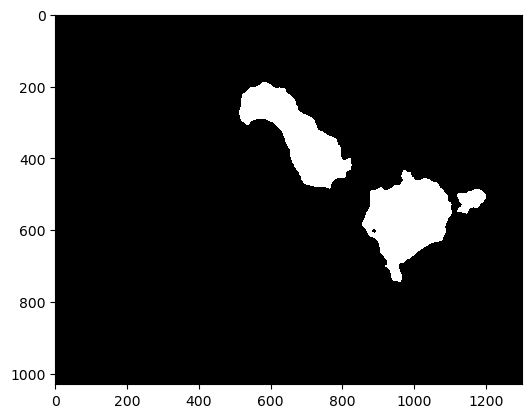

In [14]:
blue_mask =dip.RangeThreshold(r_image_1_sm,0,3000)
blue_mask.Show()

In [15]:
type(blue_mask)

diplib.PyDIP_bin.Image

In [16]:
measure = ['Center', 'Size' , 'Perimeter' , 'Roundness' , 'Mean' , 'StandardDeviation' , 'MaxVal']

In [19]:
image_1_grey = dip.ColorSpaceManager.Convert(image_1,"grey")

In [20]:
otsu_image_g = dip.Label(blue_mask, minSize=1000)    
m = dip.MeasurementTool.Measure(otsu_image_g,image_1_grey,measure)

In [22]:
print(m)

  |                  Center |       Size |  Perimeter |  Roundness |       Mean | StandardDeviation |     MaxVal |  SolidArea | 
- | ----------------------- | ---------- | ---------- | ---------- | ---------- | ----------------- | ---------- | ---------- | 
  |       dim0 |       dim1 |            |            |            |            |                   |            |            | 
  |       (px) |       (px) |     (px^2) |       (px) |            |            |                   |            |     (px^2) | 
- | ---------- | ---------- | ---------- | ---------- | ---------- | ---------- | ----------------- | ---------- | ---------- | 
1 |      673.0 |      335.7 |  3.878e+04 |      1004. |     0.4833 |  8.989e+06 |         4.745e+06 |  5.439e+07 |  3.878e+04 | 
2 |      979.5 |      570.9 |  4.344e+04 |      935.0 |     0.6257 |  8.823e+06 |         5.218e+06 |  3.938e+07 |  4.354e+04 | 
3 |      1157. |      517.7 |      3583. |      263.5 |     0.6487 |  9.104e+06 |         4.750e+

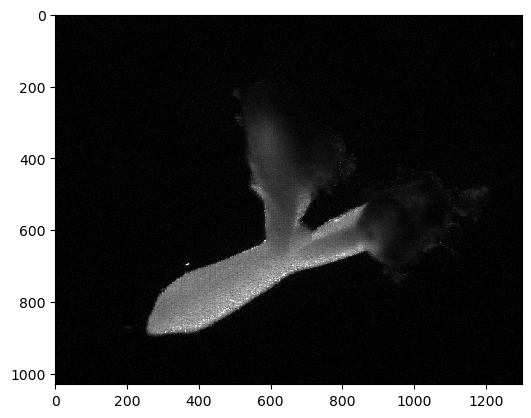

In [9]:
image_1_g = dip.ColorSpaceManager.Convert(image_1,"grey")
image_1_g.Show()

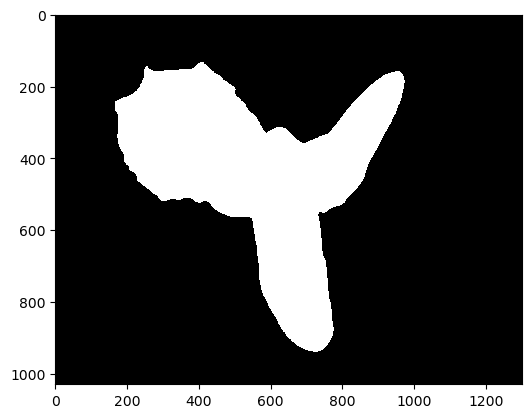

In [10]:
image_2_mask = segmentation('w8t1t2_d7_02')
image_2_mask.Show()

In [11]:
image_2 = dip.ImageRead('w8t1t2_d7_02')
img_2_meas = measurament(image_2,image_2_mask)

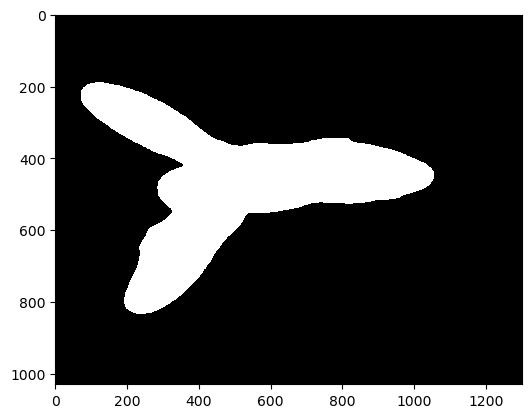

In [12]:
image_3_mask = segmentation('w8t1t2_d7_03')
image_3_mask.Show()

In [13]:
image_3 = dip.ImageRead('w8t1t2_d7_03')
img_3_meas = measurament(image_3,image_3_mask)

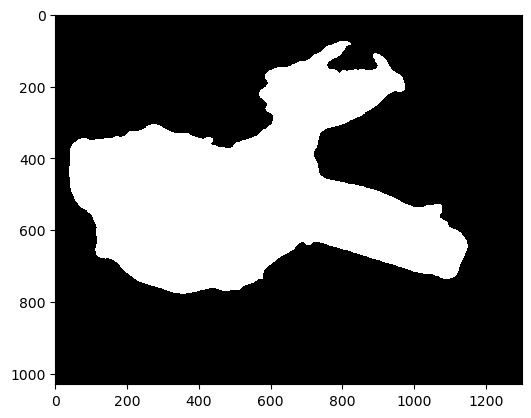

In [14]:
image_4_mask = segmentation('w8t1t2_d7_04')
image_4_mask.Show()

In [15]:
image_4 = dip.ImageRead('w8t1t2_d7_04')
img_4_meas = measurament(image_4,image_4_mask)


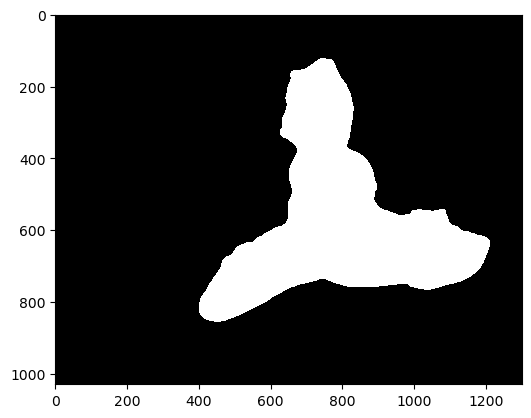

In [16]:
image_5_mask = segmentation('w8t1t2_d7_05')
image_5_mask.Show()

In [17]:
image_5 = dip.ImageRead('w8t1t2_d7_05')
img_5_meas = measurament(image_5,image_5_mask)

In [18]:
blue_area_list[4]

1225807

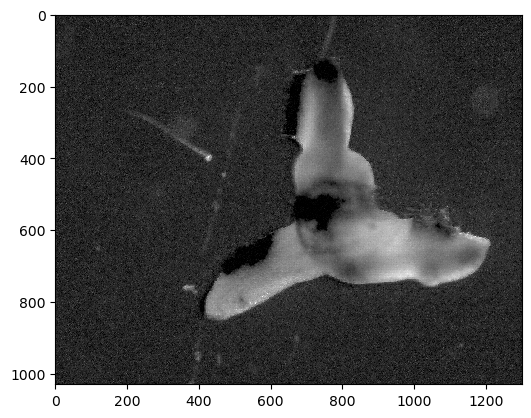

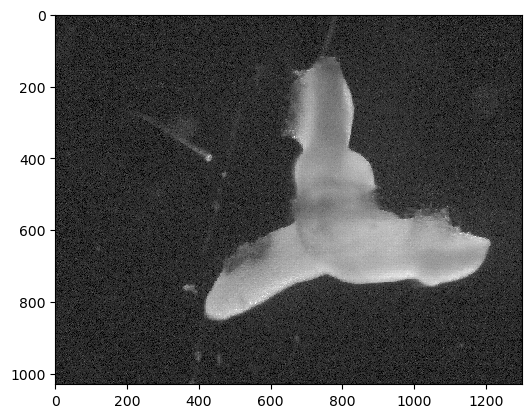

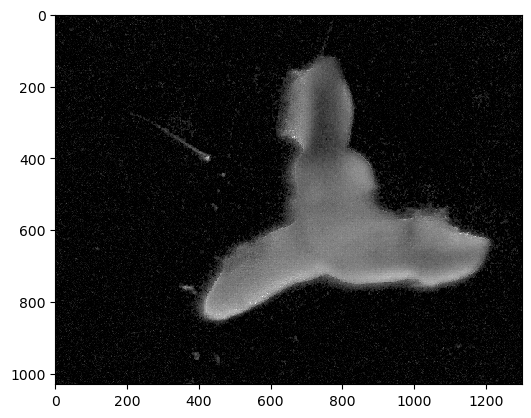

In [19]:
x_5 = np.array(image_5)
r_channel_5 = x_5[:, :, 0]
g_channel_5 = x_5[:, :, 1]
b_channel_5 = x_5[:, :, 2]

r_image_5 = dip.Image(r_channel_5)
g_image_5 = dip.Image(g_channel_5)
b_image_5 = dip.Image(b_channel_5)
r_image_5.Show()
g_image_5.Show()
b_image_5.Show()

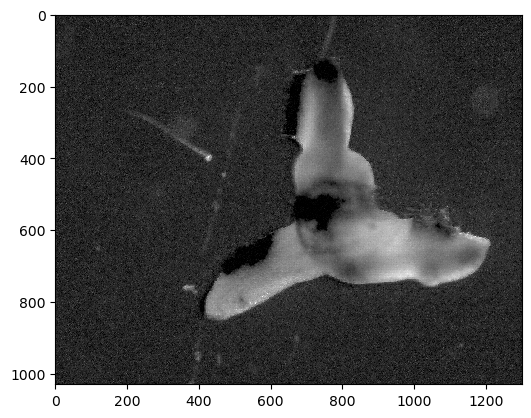

In [334]:
r_image_5.Show()

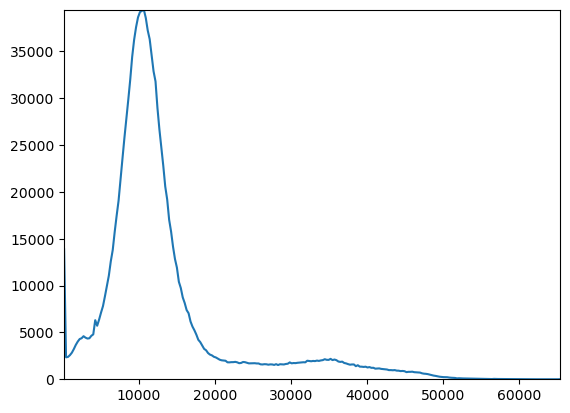

In [335]:
h = dip.Histogram(r_image_5)
h.Show()

In [ ]:
r

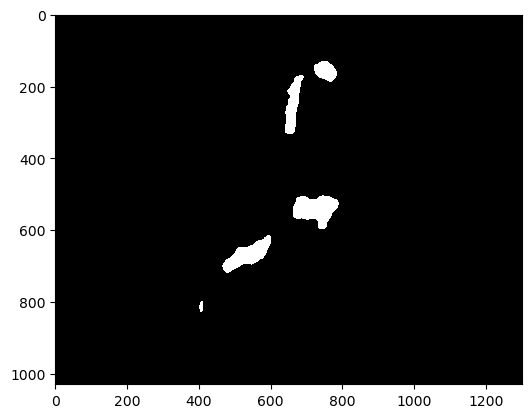

In [337]:
x = dip.RangeThreshold(r_image_5_sm,0,5000)
x.Show()

In [340]:
type(x)

diplib.PyDIP_bin.Image

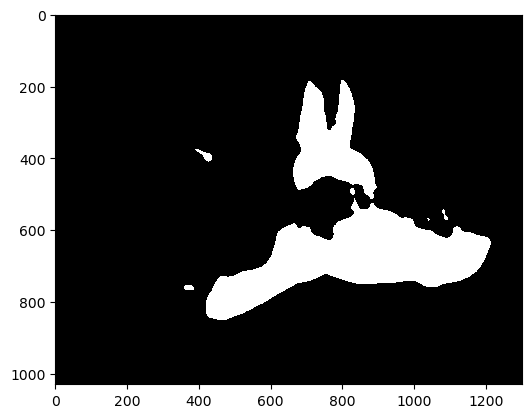

In [20]:
r_image_5_sm = dip.Gauss(r_image_5,5)
r_img_5_sm = dip.OtsuThreshold(r_image_5_sm)
r_img_5_sm = dip.FillHoles(r_img_5_sm)
r_img_5_sm.Show()

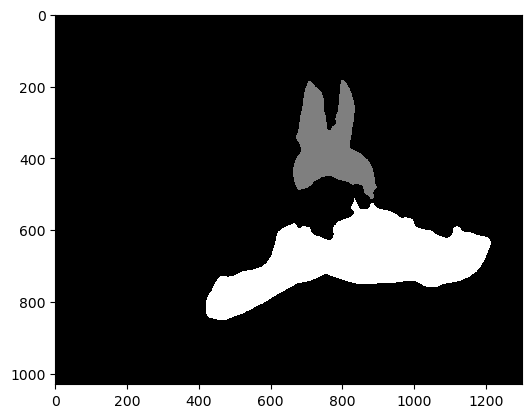

In [21]:
r_img_5_sm = dip.Label(r_img_5_sm, minSize=1500)
r_img_5_sm.Show()

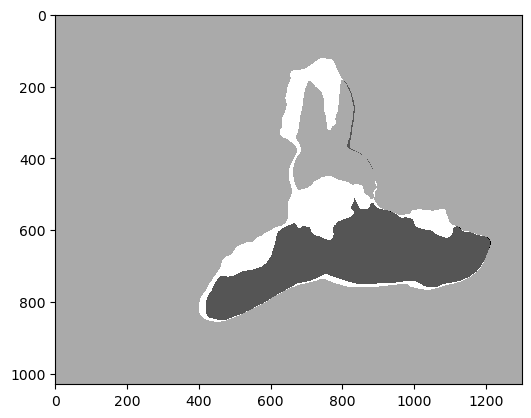

In [22]:
f = image_5_mask -r_img_5_sm
f.Show()

In [23]:
dip.MaximumAndMinimum(f)

(-2.0, 1.0)

In [24]:
x_seg = np.array(f)
c = 0
for i in range(1030):
    for j in range(1300):
        if x_seg[i][j]==1:
            c=c+1

In [25]:
c

71990

In [26]:
blue_area_list[4] = c

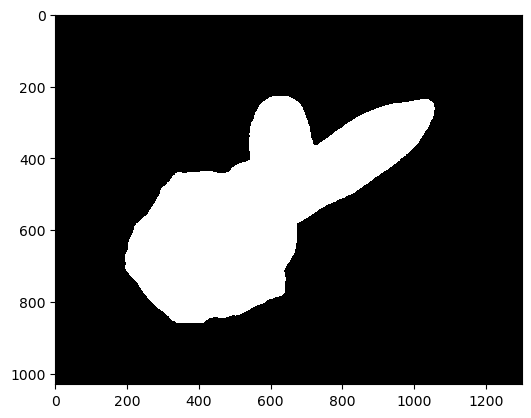

In [27]:
image_7_mask = segmentation('w8t1t2_d7_07')
image_7_mask.Show()

In [28]:
image_7 = dip.ImageRead('w8t1t2_d7_07')
img_7_meas = measurament(image_7,image_7_mask)

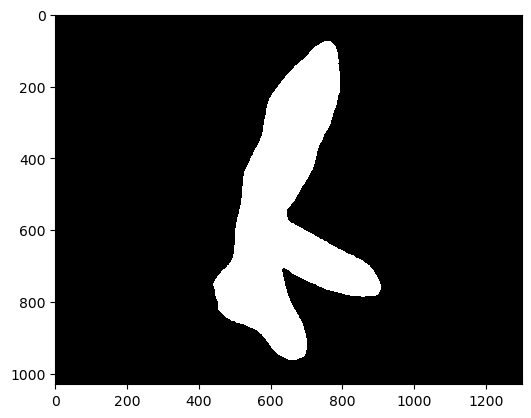

In [29]:
image_8_mask = segmentation('w8t1t2_d7_08')
image_8_mask.Show()

In [30]:
image_8 = dip.ImageRead('w8t1t2_d7_08')
img_8_meas = measurament(image_8,image_8_mask)

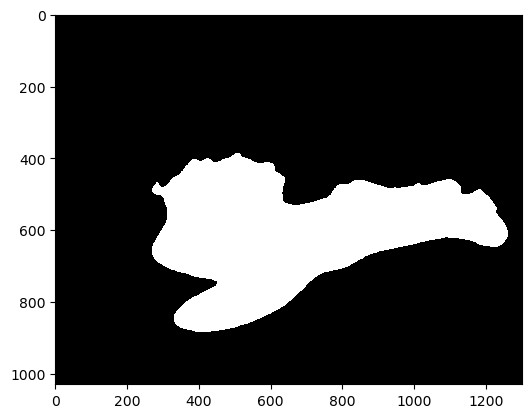

In [31]:
image_9_mask = segmentation('w8t1t2_d7_09')
image_9_mask.Show()

In [32]:
image_9 = dip.ImageRead('w8t1t2_d7_09')
img_9_meas = measurament(image_9,image_9_mask)

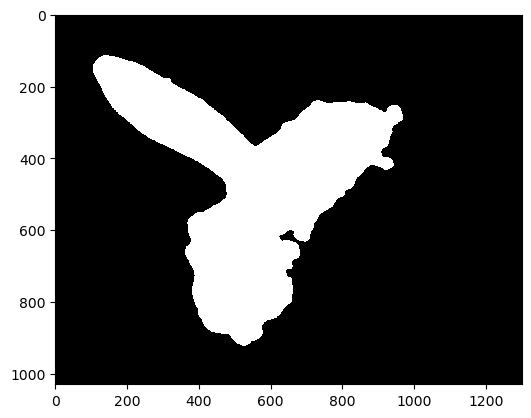

In [33]:
image_10_mask = segmentation('w8t1t2_d7_10')
image_10_mask.Show()

In [34]:
image_10 = dip.ImageRead('w8t1t2_d7_10')
img_10_meas = measurament(image_10,image_10_mask)

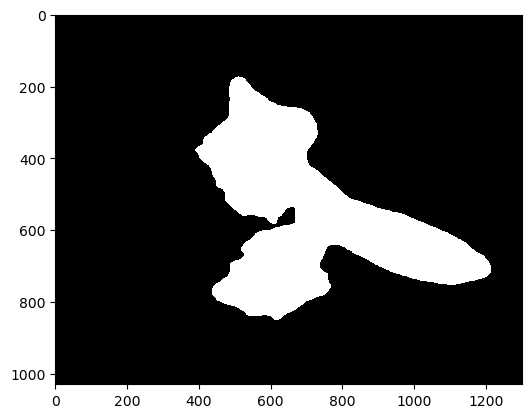

In [35]:
image_11_mask = segmentation('w8t1t2_d7_11')
image_11_mask.Show()

In [36]:
image_11 = dip.ImageRead('w8t1t2_d7_11')
img_11_meas = measurament(image_11,image_11_mask)

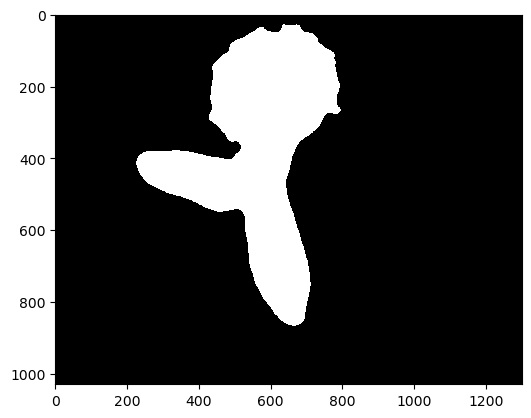

In [37]:
image_12_mask = segmentation('w8t1t2_d7_12')
image_12_mask.Show()

In [38]:
image_12 = dip.ImageRead('w8t1t2_d7_12')
img_12_meas = measurament(image_12,image_12_mask)

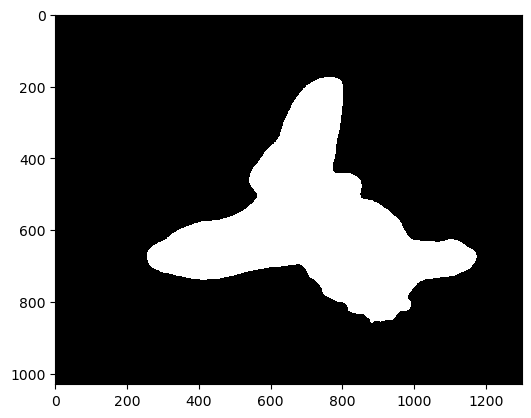

In [39]:
image_13_mask = segmentation('w8t1t2_d7_13')
image_13_mask.Show()

In [40]:
image_13 = dip.ImageRead('w8t1t2_d7_13')
img_13_meas = measurament(image_13,image_13_mask)

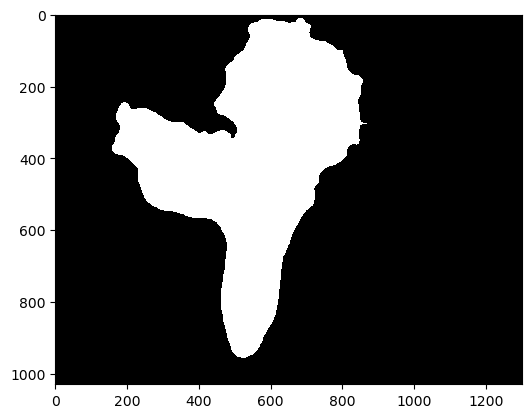

In [41]:
image_14_mask = segmentation('w8t1t2_d7_14')
image_14_mask.Show()

In [42]:
image_14 = dip.ImageRead('w8t1t2_d7_14')
img_14_meas = measurament(image_14,image_14_mask)

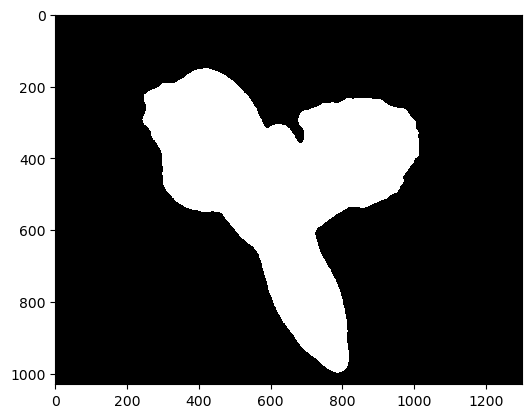

In [43]:
image_15_mask = segmentation('w8t1t2_d7_15')
image_15_mask.Show()

In [44]:
image_15 = dip.ImageRead('w8t1t2_d7_15')
img_15_meas = measurament(image_15,image_15_mask)

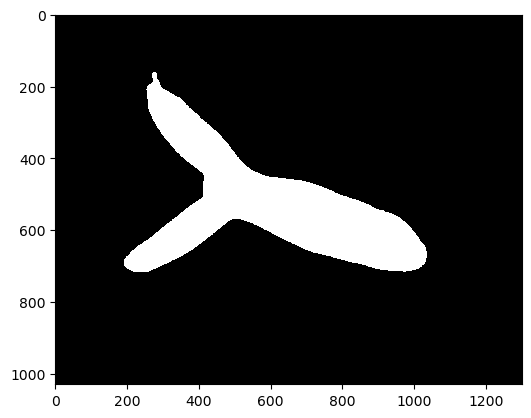

In [45]:
image_16_mask = segmentation('w8t1t2_d7_16')
image_16_mask.Show()

In [46]:
image_16 = dip.ImageRead('w8t1t2_d7_16')
img_16_meas = measurament(image_16,image_16_mask)

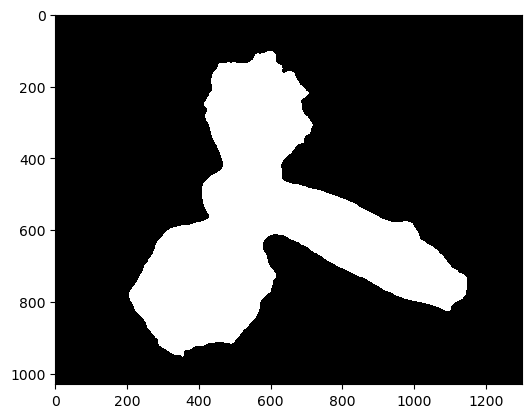

In [47]:
image_17_mask = segmentation('w8t1t2_d7_17')
image_17_mask.Show()

In [48]:
image_17 = dip.ImageRead('w8t1t2_d7_17')
img_17_meas = measurament(image_17,image_17_mask)

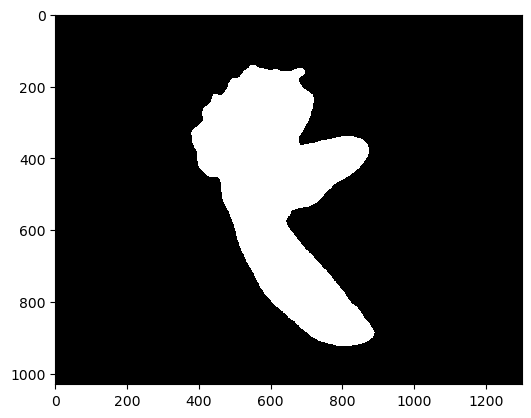

In [49]:
image_18_mask = segmentation('w8t1t2_d7_18')
image_18_mask.Show()

In [50]:
image_18 = dip.ImageRead('w8t1t2_d7_18')
img_18_meas = measurament(image_18,image_18_mask)

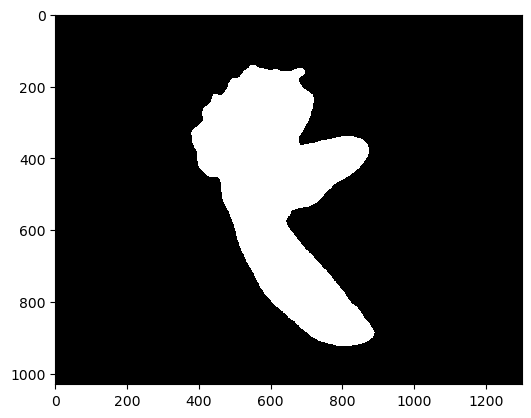

In [51]:
image_18_mask.Show()

In [52]:
x_18 = np.array(image_18)
r_channel_18 = x_18[:, :, 0]
g_channel_18 = x_18[:, :, 1]
b_channel_18 = x_18[:, :, 2]

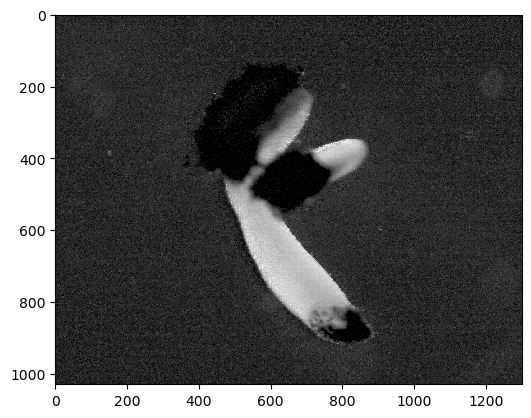

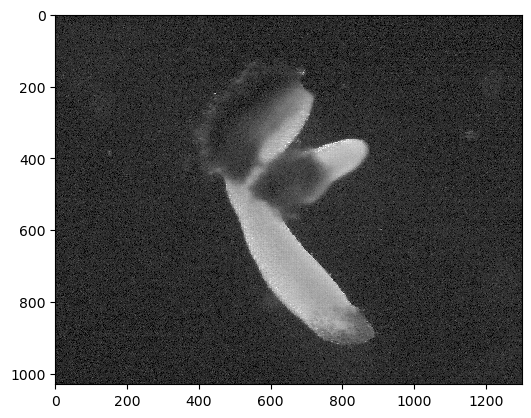

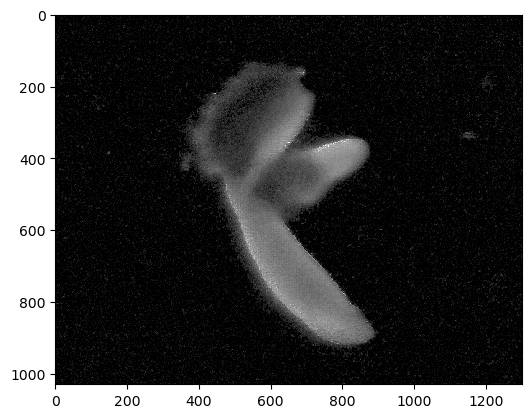

In [53]:
r_image_18 = dip.Image(r_channel_18)
g_image_18 = dip.Image(g_channel_18)
b_image_18 = dip.Image(b_channel_18)
r_image_18.Show()
g_image_18.Show()
b_image_18.Show()

In [54]:
r_image_18_sm = dip.Gauss(r_image_18,5)

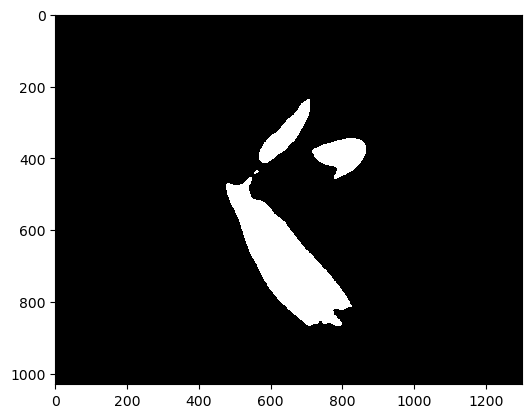

In [55]:
d = dip.OtsuThreshold(r_image_18_sm)
d.Show()

In [56]:
inv_image_18_mask = dip.Invert(image_18_mask)

In [57]:
inv_r_image_18_mask = dip.Invert(d)

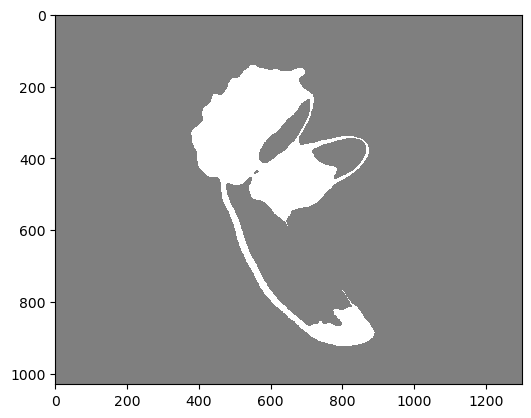

In [58]:
f = inv_image_18_mask-inv_r_image_18_mask
f = dip.Invert(f)
f.Show()

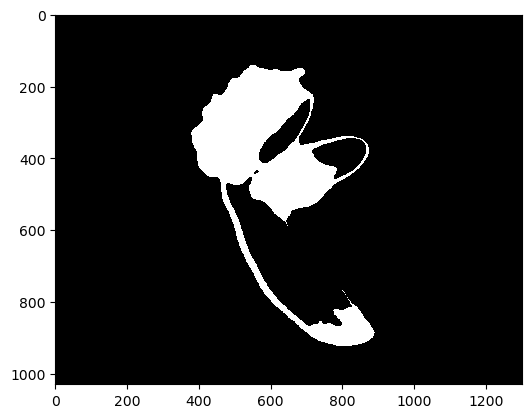

In [59]:
f = dip.OtsuThreshold(f)
f.Show()

In [60]:
x_seg = np.array(f)

In [61]:
c = 0
for i in range(1030):
    for j in range(1300):
        if x_seg[i][j]==1:
            c=c+1

In [62]:
blue_area_list[16]=c

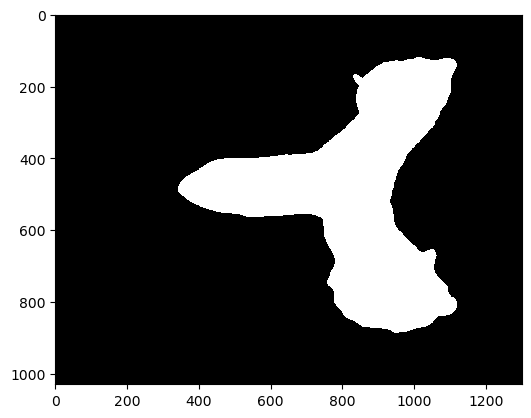

In [63]:
image_19_mask = segmentation('w8t1t2_d7_19')
image_19_mask.Show()

In [64]:
image_19 = dip.ImageRead('w8t1t2_d7_19')
img_19_meas = measurament(image_19,image_19_mask)

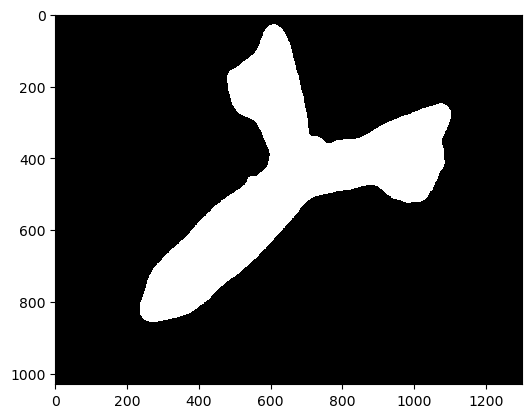

In [65]:
image_20_mask = segmentation('w8t1t2_d7_20')
image_20_mask.Show()

In [66]:
image_20 = dip.ImageRead('w8t1t2_d7_20')
img_20_meas = measurament(image_20,image_20_mask)

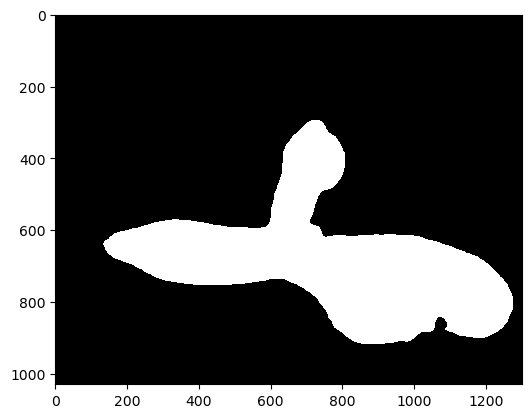

In [67]:
image_21_mask = segmentation('w8t1t2_d7_21')
image_21_mask.Show()

In [68]:
image_21 = dip.ImageRead('w8t1t2_d7_21')
img_21_meas = measurament(image_21,image_21_mask)

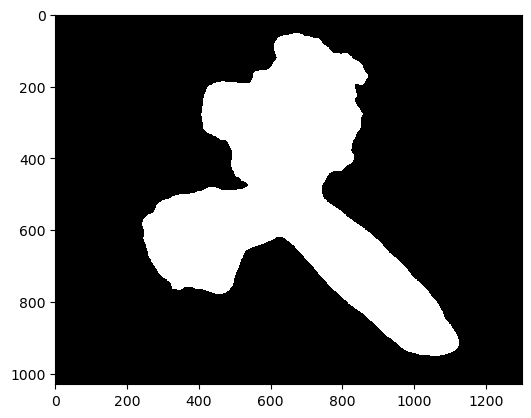

In [69]:
image_22_mask = segmentation('w8t1t2_d7_22')
image_22_mask.Show()

In [70]:
image_22 = dip.ImageRead('w8t1t2_d7_22')
img_22_meas = measurament(image_22,image_22_mask)

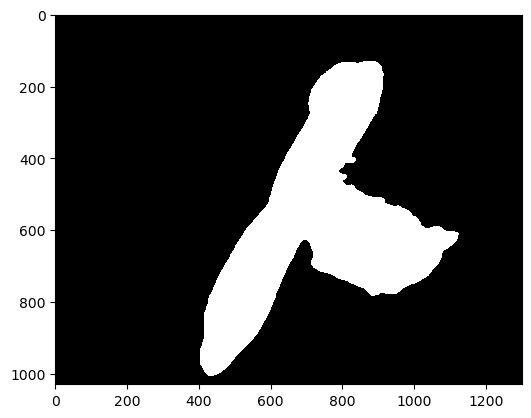

In [71]:
image_23_mask = segmentation('w8t1t2_d7_23')
image_23_mask.Show()

In [72]:
image_23 = dip.ImageRead('w8t1t2_d7_23')
img_23_meas = measurament(image_23,image_23_mask)

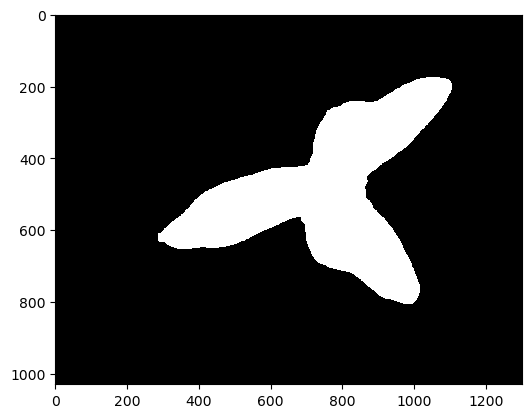

In [73]:
image_24_mask = segmentation('w8t1t2_d7_24')
image_24_mask.Show()

In [74]:
image_24 = dip.ImageRead('w8t1t2_d7_24')
img_24_meas = measurament(image_24,image_24_mask)

In [75]:
x_24 = np.array(image_24)
r_channel_24 = x_24[:, :, 0]
g_channel_24 = x_24[:, :, 1]
b_channel_24 = x_24[:, :, 2]

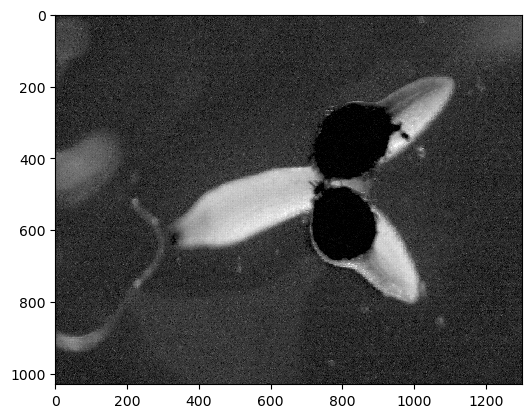

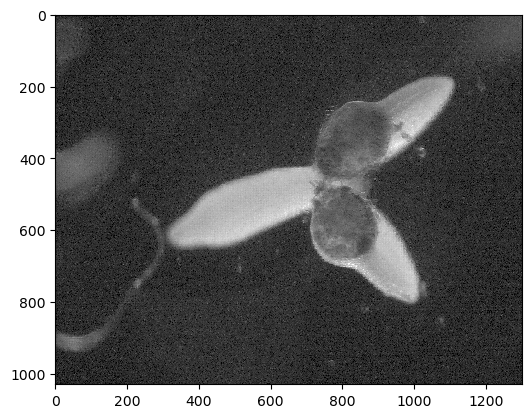

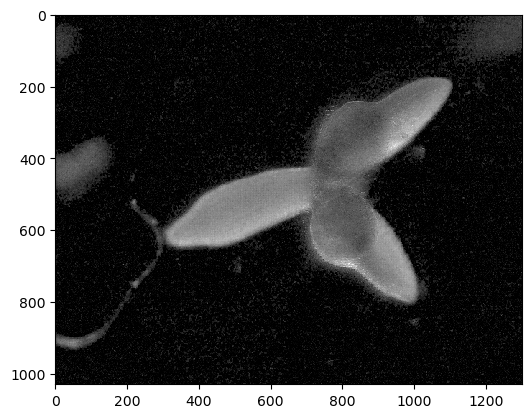

In [76]:
r_image_24 = dip.Image(r_channel_24)
g_image_24 = dip.Image(g_channel_24)
b_image_24 = dip.Image(b_channel_24)
r_image_24.Show()
g_image_24.Show()
b_image_24.Show()

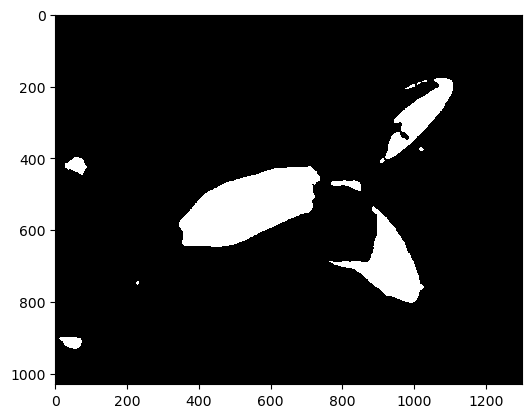

In [77]:
r_image_24_sm= dip.Gauss(r_image_24,3)
r_img_24_sm = dip.OtsuThreshold(r_image_24_sm)
r_img_24_sm.Show()

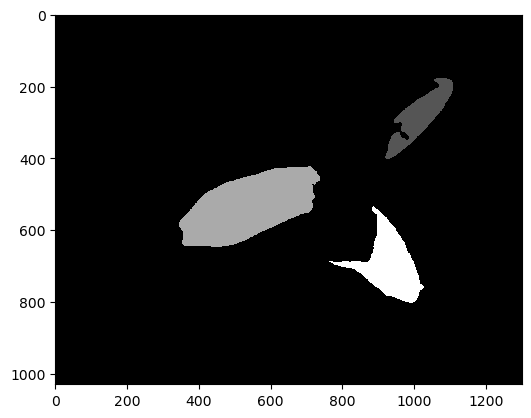

In [78]:
m = dip.Label(r_img_24_sm, minSize=2000)
m.Show()

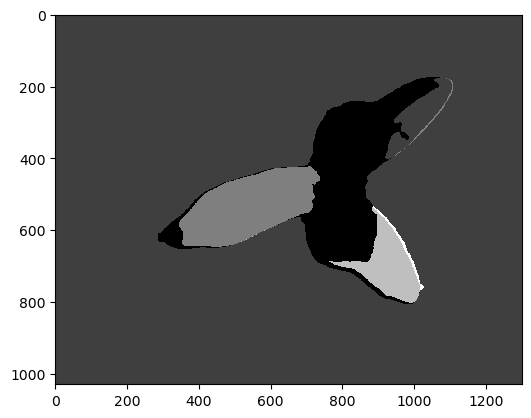

In [79]:
f = m - image_24_mask
f.Show()

In [80]:
dip.MaximumAndMinimum(f)

(-1.0, 3.0)

In [81]:
x_seg = np.array(f)

In [82]:
c = 0
for i in range(1030):
    for j in range(1300):
        if x_seg[i][j]==-1:
            c=c+1

In [83]:
c

99167

In [84]:
blue_area_list[22] = c

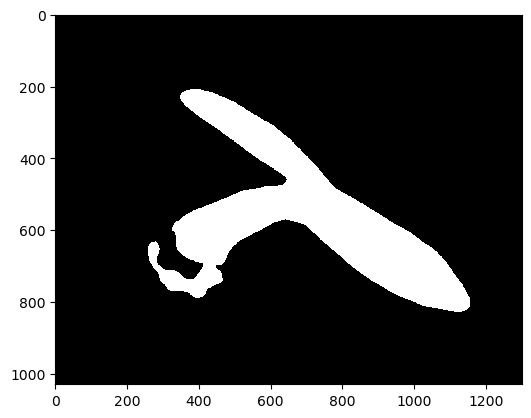

In [85]:
image_25_mask = segmentation('w8t1t2_d7_25')
image_25_mask.Show()

In [86]:
image_25 = dip.ImageRead('w8t1t2_d7_25')
img_25_meas = measurament(image_25,image_25_mask)

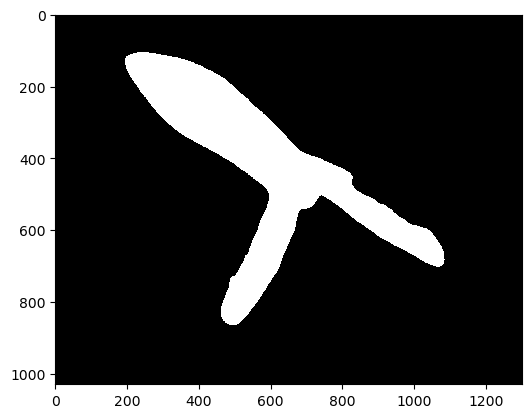

In [87]:
image_26_mask = segmentation('w8t1t2_d7_26')
image_26_mask.Show()

In [88]:
image_26 = dip.ImageRead('w8t1t2_d7_26')
img_26_meas = measurament(image_26,image_26_mask)

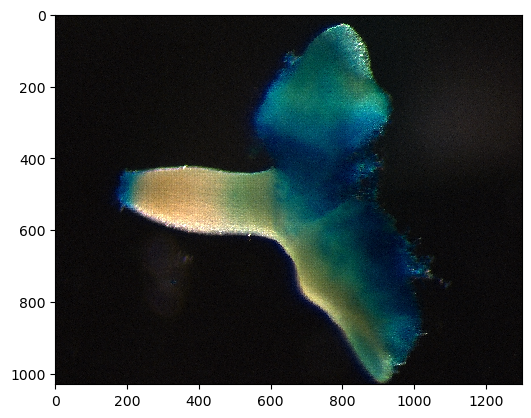

In [89]:
image_27 = dip.ImageRead('w8t1t2_d7_27')
image_27.Show()

In [90]:
x_27=np.array(image_27)
r_channel_27 = x_27[:, :, 0]
g_channel_27 = x_27[:, :, 1]
b_channel_27 = x_27[:, :, 2]

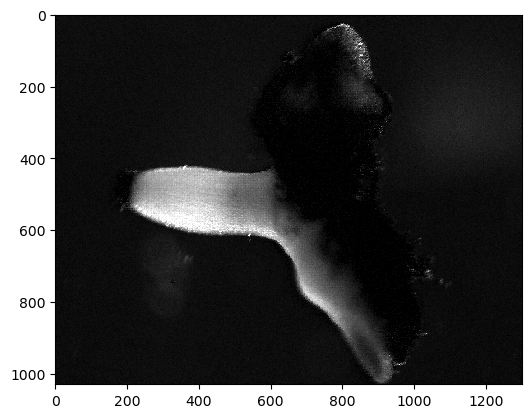

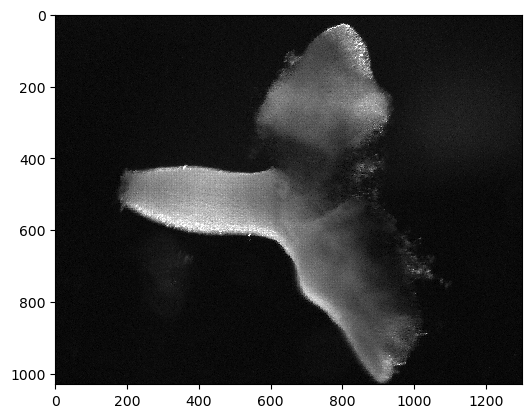

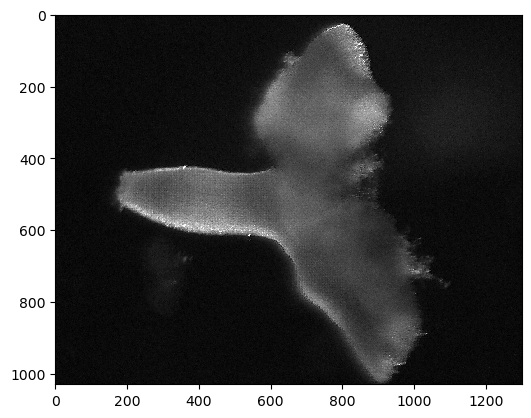

In [91]:
r_image_27 = dip.Image(r_channel_27)
g_image_27 = dip.Image(g_channel_27)
b_image_27 = dip.Image(b_channel_27)
r_image_27.Show()
g_image_27.Show()
b_image_27.Show()

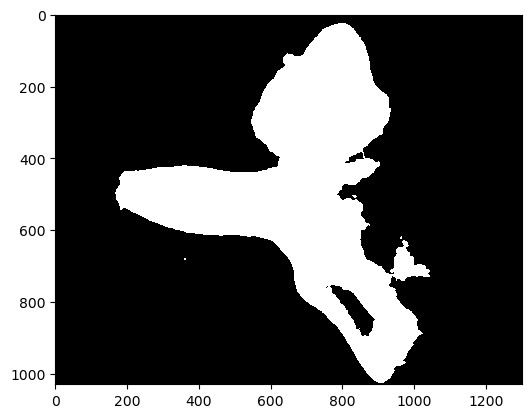

In [92]:
b_image_27_sm = dip.Gauss(b_image_27,3)
b_img_27_otsu_sm = dip.OtsuThreshold(b_image_27_sm)
b_img_27_otsu_sm.Show()

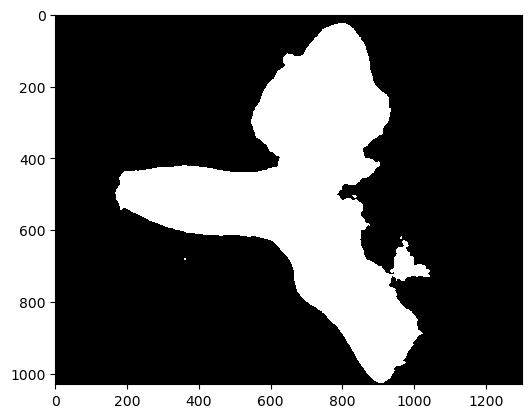

In [93]:
b_img_27_otsu_sm = dip.FillHoles(b_img_27_otsu_sm)
b_img_27_otsu_sm.Show()

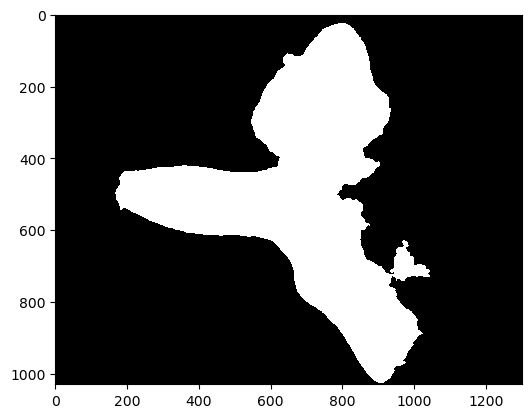

In [94]:
image_27_mask = dip.Label(b_img_27_otsu_sm, minSize=3000)
image_27_mask.Show()

In [95]:
mask_list.append(image_27_mask)

In [96]:
img_27_meas = measurament(image_27,image_27_mask)


In [97]:
r_image_27_sm = dip.Gauss(r_image_27,3)

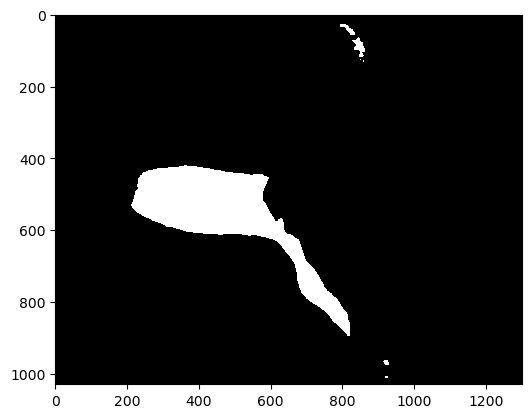

In [98]:
r_img_27_otsu_sm = dip.OtsuThreshold(r_image_27_sm)
r_img_27_otsu_sm.Show()

In [99]:
inv_r_img_27_otsu_sm= dip.Invert(r_img_27_otsu_sm)

In [100]:
inv_image_27_mask = dip.Invert(image_27_mask)

In [101]:
s = inv_image_27_mask-inv_r_img_27_otsu_sm
s = dip.Invert(s)

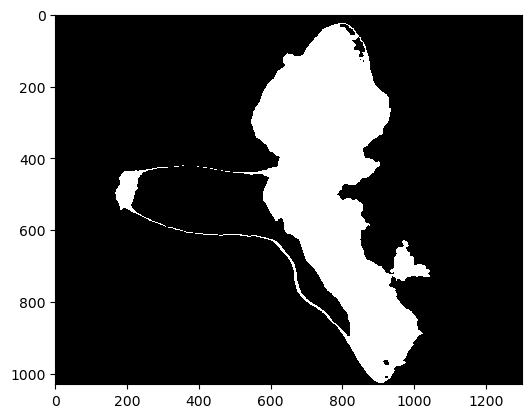

In [102]:
s.Show()

In [103]:
min_A,max_A=dip.MaximumAndMinimum(s)

In [104]:
min_A

-4294967294.0

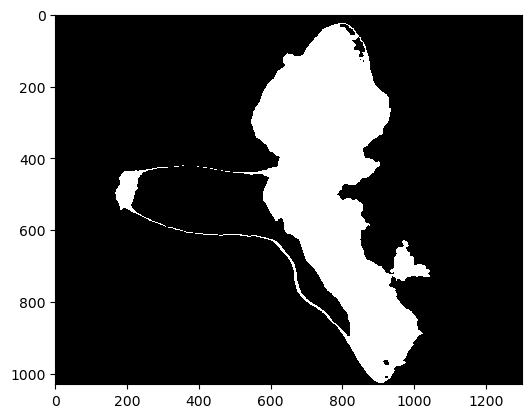

In [105]:
f = dip.OtsuThreshold(s)
f.Show()

In [106]:
x_seg = np.array(f)

In [107]:
c = 0
for i in range(1030):
    for j in range(1300):
        if x_seg[i][j]==1:
            c=c+1

In [108]:
c

236169

In [109]:
blue_area_list.append(c)

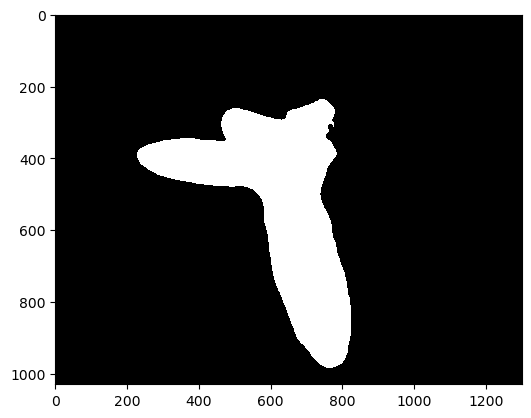

In [110]:
image_28_mask = segmentation('w8t1t2_d7_28')
image_28_mask.Show()

In [111]:
image_28 = dip.ImageRead('w8t1t2_d7_28')
img_28_meas = measurament(image_28,image_28_mask)

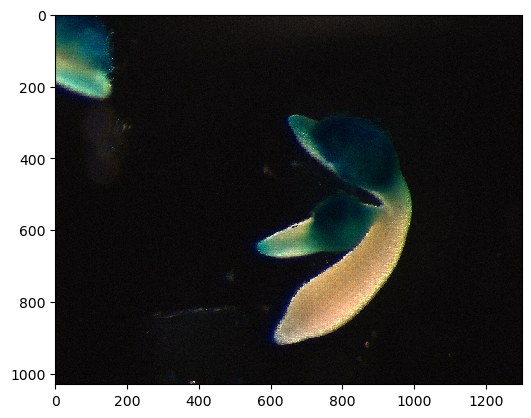

In [112]:
image_29 = dip.ImageRead('w8t1t2_d7_29')
image_29.Show()

In [113]:
x_29=np.array(image_29)
r_channel_29 = x_29[:, :, 0]
g_channel_29 = x_29[:, :, 1]
b_channel_29 = x_29[:, :, 2]

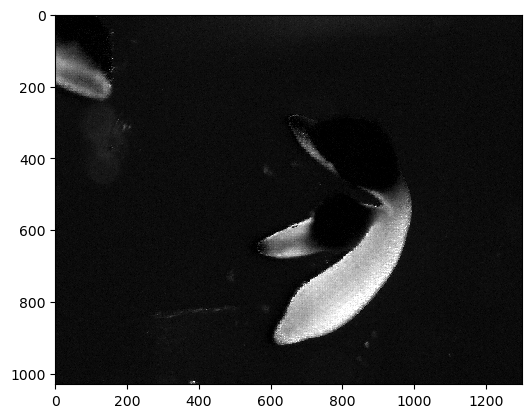

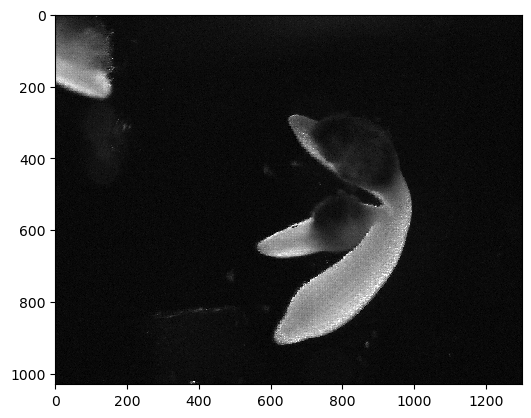

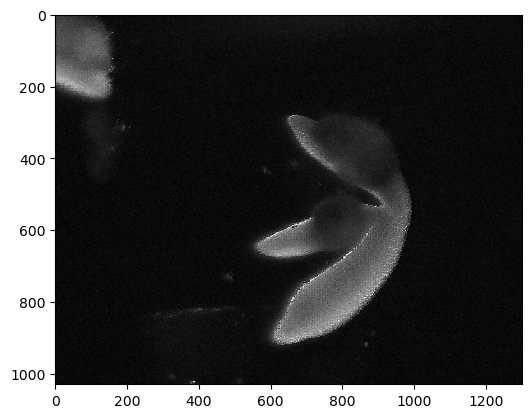

In [114]:
r_image_29 = dip.Image(r_channel_29)
g_image_29 = dip.Image(g_channel_29)
b_image_29 = dip.Image(b_channel_29)
r_image_29.Show()
g_image_29.Show()
b_image_29.Show()

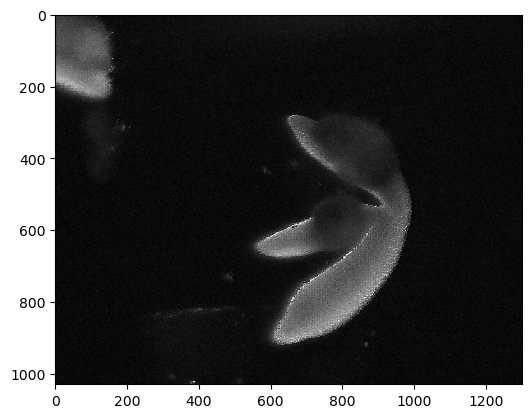

In [115]:
b_image_29.Show()

In [116]:
b_image_29_m = dip.Gauss(b_image_29,5)

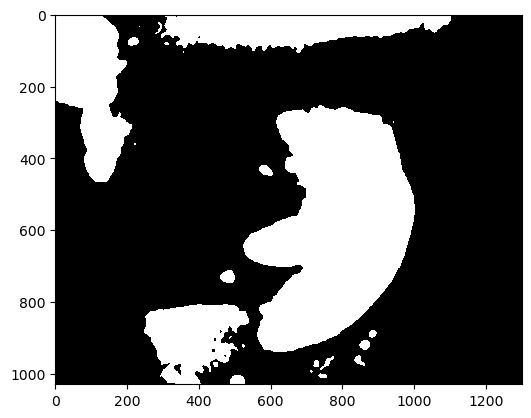

In [117]:
b = dip.BackgroundThreshold(b_image_29_m)
b.Show()

In [118]:
image_29_mask = dip.EdgeObjectsRemove(b)

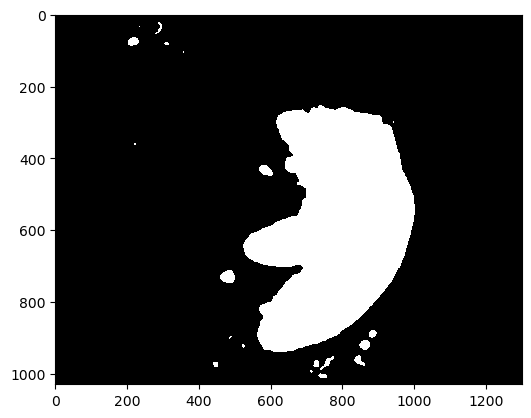

In [119]:
image_29_mask.Show()

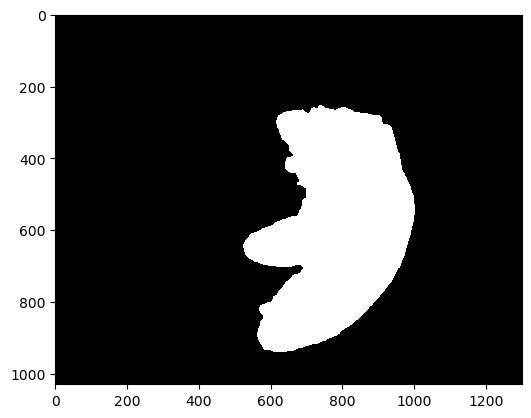

In [120]:
image_29_mask = dip.Label(image_29_mask, minSize=3000)
image_29_mask.Show()

In [121]:
mask_list.append(image_29_mask)

In [122]:
img_29_meas = measurament(image_29,image_29_mask)

In [123]:
r_image_29_sm = dip.Gauss(r_image_29,5)

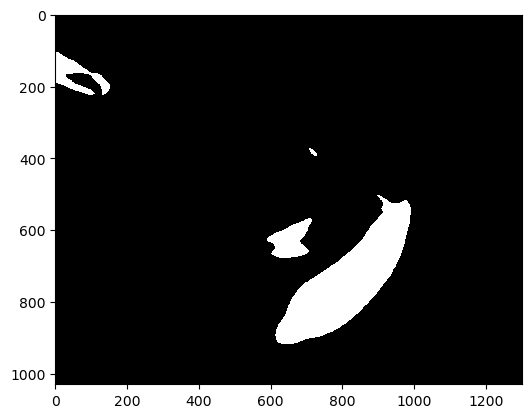

In [124]:
r_image_29_sm = dip.OtsuThreshold(r_image_29_sm)
r_image_29_sm.Show()

In [125]:
r_image_29_sm=dip.EdgeObjectsRemove(r_image_29_sm)

In [126]:
inv_image_29_mask = dip.Invert(image_29_mask)

In [127]:
inv_r_image_29_sm=dip.Invert(r_image_29_sm)

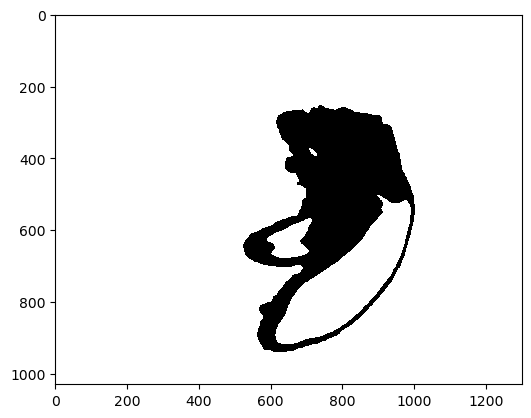

In [128]:
f = inv_image_29_mask-inv_r_image_29_sm
f.Show()

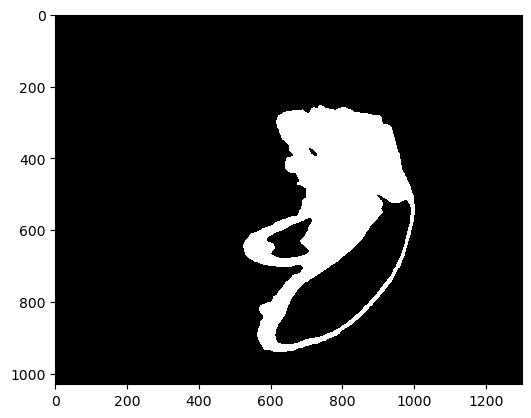

In [129]:
f = dip.Invert(f)
f.Show()

In [130]:
dip.MaximumAndMinimum(f)

(-4294967294.0, -4294967293.0)

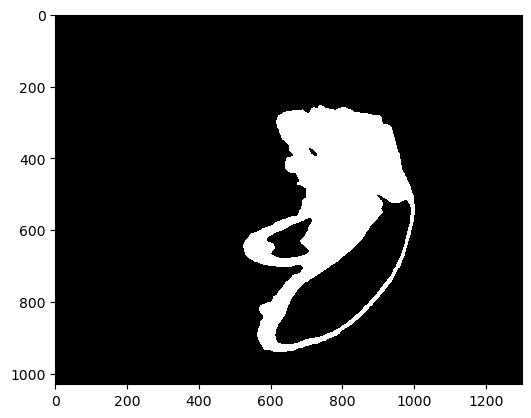

In [131]:
f = dip.OtsuThreshold(f)
f.Show()

In [132]:
x_seg = np.array(f)

In [133]:
c = 0
for i in range(1030):
    for j in range(1300):
        if x_seg[i][j]==1:
            c=c+1

In [134]:
c

139367

In [135]:
blue_area_list.append(c)

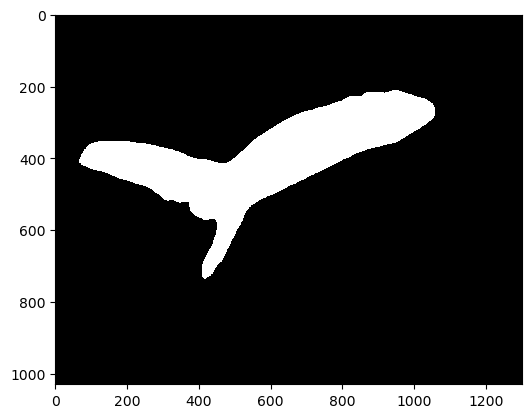

In [136]:
image_30_mask = segmentation('w8t1t2_d7_30')
image_30_mask.Show()

In [137]:
image_30 = dip.ImageRead('w8t1t2_d7_30')
img_30_meas = measurament(image_30,image_30_mask)

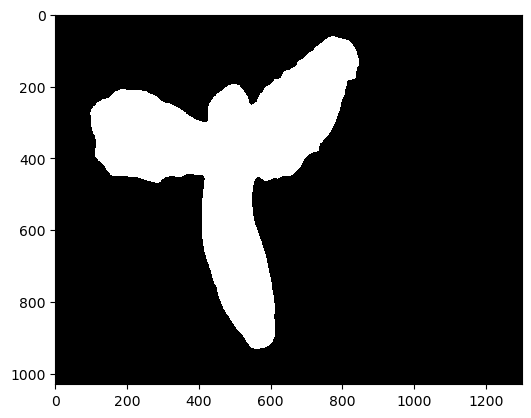

In [138]:
image_31_mask = segmentation('w8t1t2_d7_31')
image_31_mask.Show()

In [139]:
image_31 = dip.ImageRead('w8t1t2_d7_31')
img_31_meas = measurament(image_31,image_31_mask)

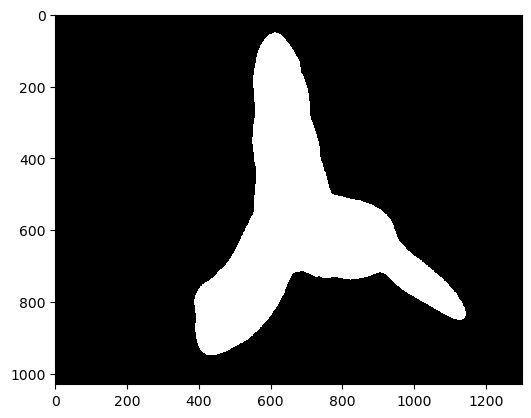

In [140]:
image_32_mask = segmentation('w8t1t2_d7_32')
image_32_mask.Show()

In [141]:
image_32 = dip.ImageRead('w8t1t2_d7_32')
img_32_meas = measurament(image_32,image_32_mask)

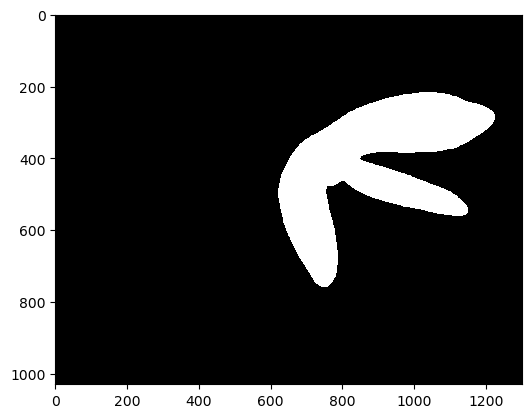

In [142]:
image_33_mask = segmentation('w8t1t2_d7_33')
image_33_mask.Show()

In [143]:
image_33 = dip.ImageRead('w8t1t2_d7_33')
img_33_meas = measurament(image_33,image_33_mask)

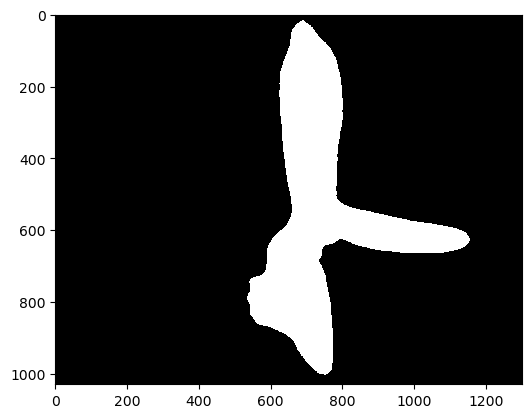

In [144]:
image_34_mask = segmentation('w8t1t2_d7_34')
image_34_mask.Show()

In [145]:
image_34 = dip.ImageRead('w8t1t2_d7_34')
img_34_meas = measurament(image_34,image_34_mask)

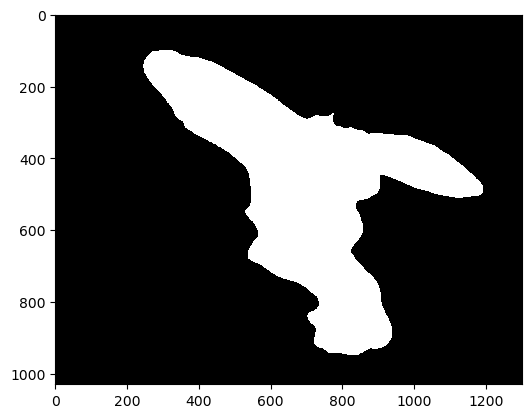

In [146]:
image_35_mask = segmentation('w8t1t2_d7_35')
image_35_mask.Show()

In [147]:
image_35 = dip.ImageRead('w8t1t2_d7_35')
img_35_meas = measurament(image_35,image_35_mask)

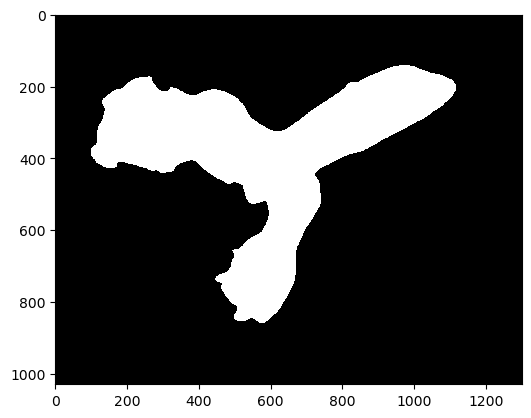

In [148]:
image_36_mask = segmentation('w8t1t2_d7_36')
image_36_mask.Show()

In [149]:
image_36 = dip.ImageRead('w8t1t2_d7_36')
img_36_meas = measurament(image_36,image_36_mask)

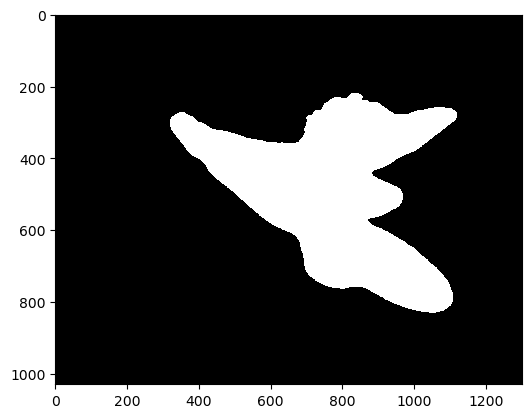

In [150]:
image_37_mask = segmentation('w8t1t2_d7_37')
image_37_mask.Show()

In [151]:
image_37 = dip.ImageRead('w8t1t2_d7_37')
img_37_meas = measurament(image_37,image_37_mask)

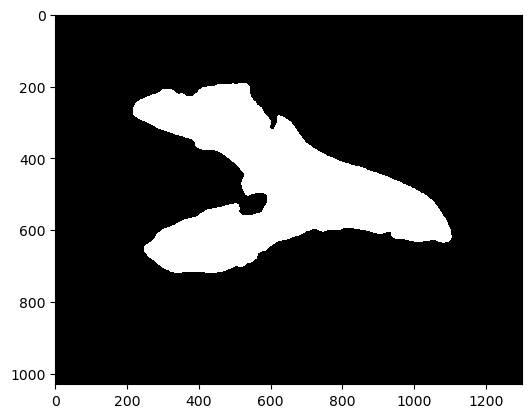

In [152]:
image_38_mask = segmentation('w8t1t2_d7_38')
image_38_mask.Show()

In [153]:
blue_area_list

[145677,
 135640,
 59598,
 328329,
 71990,
 118251,
 68411,
 110933,
 195388,
 148922,
 136279,
 136635,
 233009,
 144893,
 18798,
 225768,
 121028,
 186157,
 102319,
 148456,
 233326,
 138416,
 99167,
 46504,
 27634,
 236169,
 75783,
 139367,
 36144,
 159702,
 50074,
 16678,
 41408,
 199815,
 175510,
 87022,
 128962]

In [154]:
image_38 = dip.ImageRead('w8t1t2_d7_38')
img_38_meas = measurament(image_38,image_38_mask)

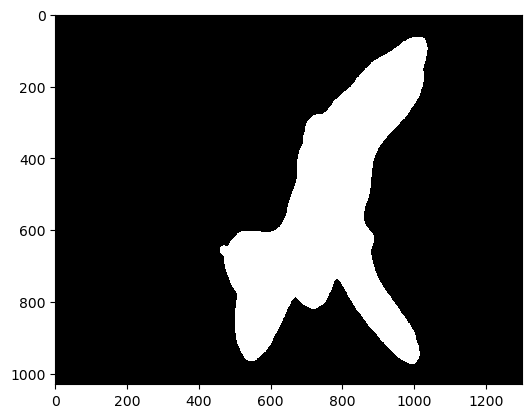

In [155]:
image_39_mask = segmentation('w8t1t2_d7_39')
image_39_mask.Show()

In [156]:
image_39 = dip.ImageRead('w8t1t2_d7_39')
img_39_meas = measurament(image_39,image_39_mask)

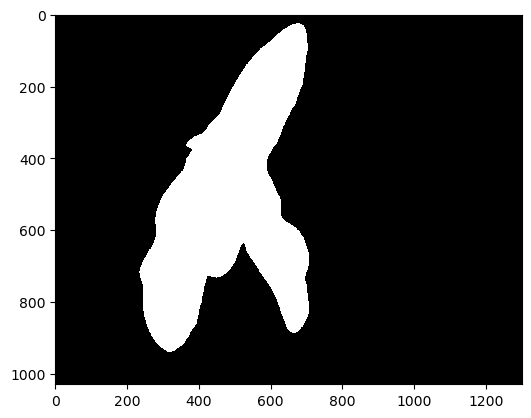

In [157]:
image_40_mask = segmentation('w8t1t2_d7_40')
image_40_mask.Show()

In [158]:
image_40 = dip.ImageRead('w8t1t2_d7_40')
img_40_meas = measurament(image_40,image_40_mask)

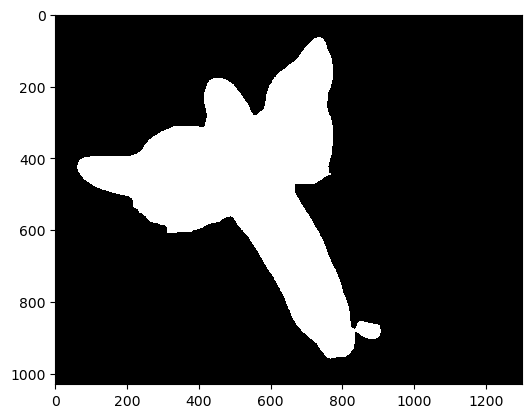

In [159]:
image_41_mask = segmentation('w8t1t2_d7_41')
image_41_mask.Show()

In [160]:
image_41 = dip.ImageRead('w8t1t2_d7_41')
img_41_meas = measurament(image_41,image_41_mask)

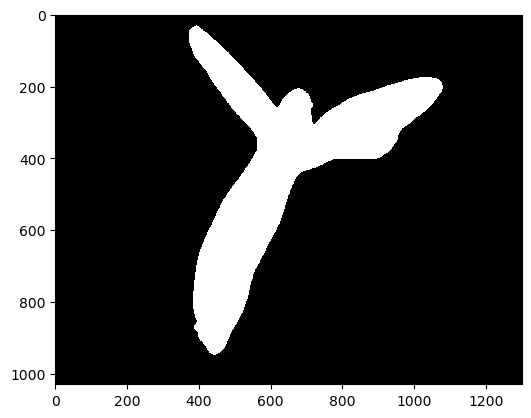

In [161]:
image_42_mask = segmentation('w8t1t2_d7_42')
image_42_mask.Show()

In [162]:
image_42 = dip.ImageRead('w8t1t2_d7_42')
img_42_meas = measurament(image_42,image_42_mask)

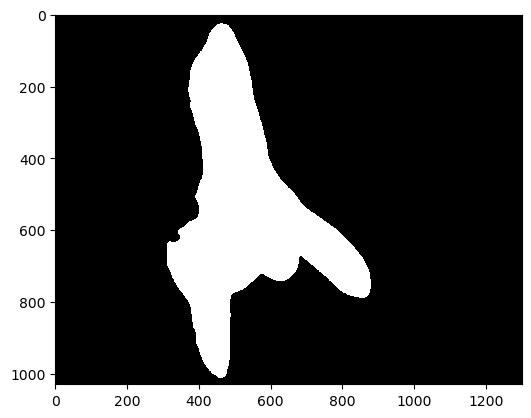

In [163]:
image_43_mask = segmentation('w8t1t2_d7_43')
image_43_mask.Show()

In [164]:
image_43 = dip.ImageRead('w8t1t2_d7_43')
img_43_meas = measurament(image_43,image_43_mask)

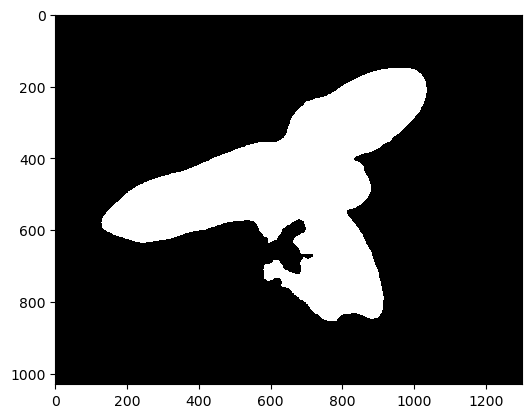

In [165]:
image_44_mask = segmentation('w8t1t2_d7_44')
image_44_mask.Show()

In [166]:
image_44 = dip.ImageRead('w8t1t2_d7_44')
img_44_meas = measurament(image_44,image_44_mask)

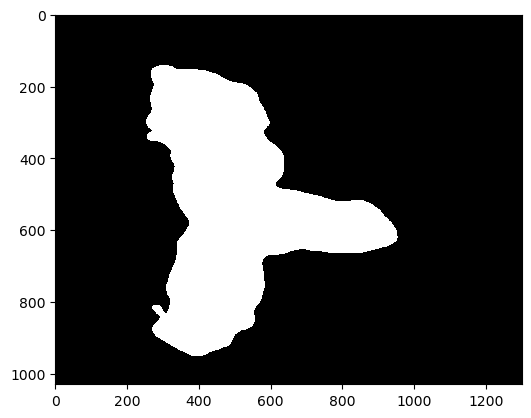

In [167]:
image_45_mask = segmentation('w8t1t2_d7_45')
image_45_mask.Show()

In [168]:
image_45 = dip.ImageRead('w8t1t2_d7_45')
img_45_meas = measurament(image_45,image_45_mask)

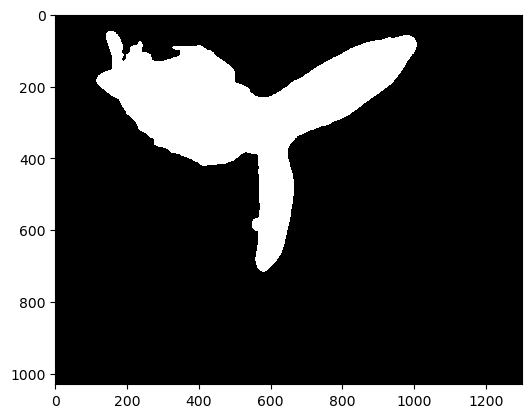

In [169]:
image_46_mask = segmentation('w8t1t2_d7_46')
image_46_mask.Show()

In [170]:
image_46 = dip.ImageRead('w8t1t2_d7_46')
img_46_meas = measurament(image_46,image_46_mask)

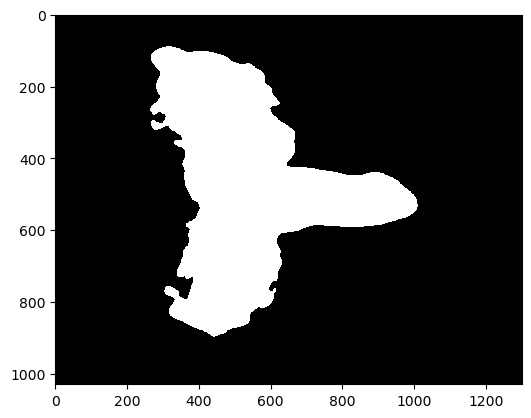

In [171]:
image_47_mask = segmentation('w8t1t2_d7_47')
image_47_mask.Show()

In [172]:
image_47 = dip.ImageRead('w8t1t2_d7_47')
img_47_meas = measurament(image_47,image_47_mask)

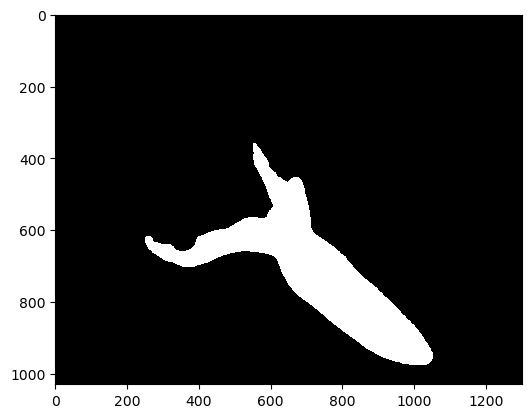

In [173]:
image_48_mask = segmentation('w8t1t2_d7_48')
image_48_mask.Show()

In [174]:
image_48 = dip.ImageRead('w8t1t2_d7_48')
img_48_meas = measurament(image_48,image_48_mask)

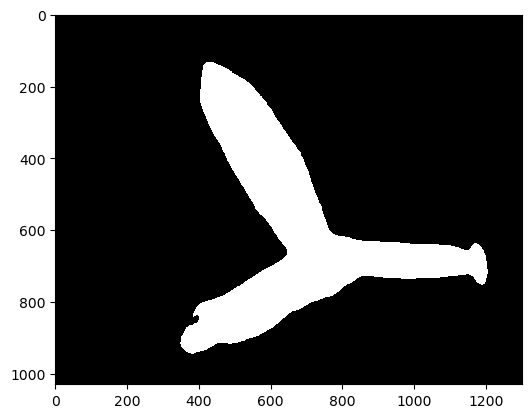

In [175]:
image_49_mask = segmentation('w8t1t2_d7_49')
image_49_mask.Show()

In [176]:
image_49 = dip.ImageRead('w8t1t2_d7_49')
img_49_meas = measurament(image_49,image_49_mask)

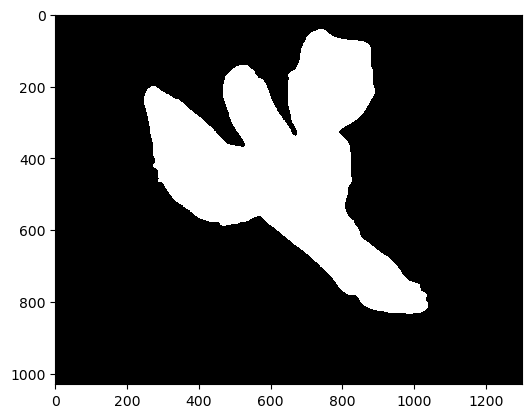

In [177]:
image_50_mask = segmentation('w8t1t2_d7_50')
image_50_mask.Show()

In [178]:
image_50 = dip.ImageRead('w8t1t2_d7_50')
img_50_meas = measurament(image_50,image_50_mask)

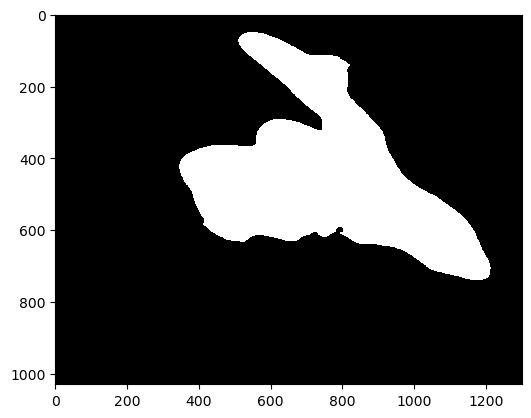

In [179]:
image_51_mask = segmentation('w8t1t2_d7_51')
image_51_mask.Show()

In [180]:
image_51 = dip.ImageRead('w8t1t2_d7_51')
img_51_meas = measurament(image_51,image_51_mask)

In [181]:
print(measurament_list[49])

  |       Size |  Perimeter |  Roundness | StandardDeviation |                                            Statistics |  SolidArea | 
- | ---------- | ---------- | ---------- | ----------------- | ----------------------------------------------------- | ---------- | 
  |            |            |            |                   |       Mean |     StdDev |   Skewness | ExcessKurtosis |            | 
  |     (px^2) |       (px) |            |                   |            |            |            |                |     (px^2) | 
- | ---------- | ---------- | ---------- | ----------------- | ---------- | ---------- | ---------- | -------------- | ---------- | 
1 |  2.558e+05 |      3002. |     0.3567 |         2.248e+07 |  2.791e+07 |  2.248e+07 |      1.220 |          1.317 |  2.558e+05 | 



In [182]:
blue_area_list[49]

1224360

In [183]:
x_51 = np.array(image_51)
r_channel_51 = x_51[:, :, 0]
g_channel_51 = x_51[:, :, 1]
b_channel_51 = x_51[:, :, 2]

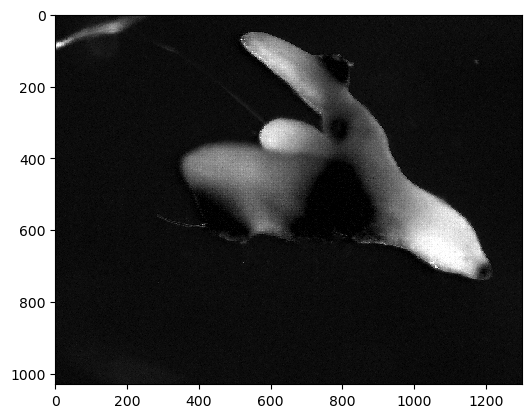

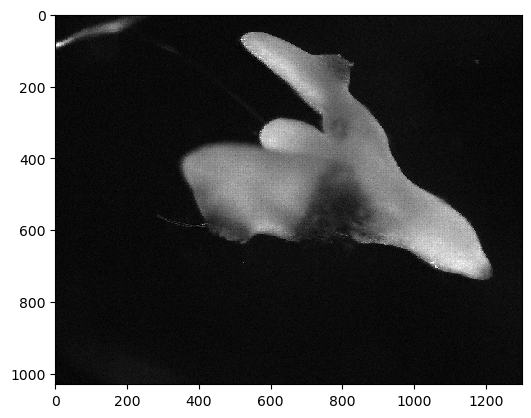

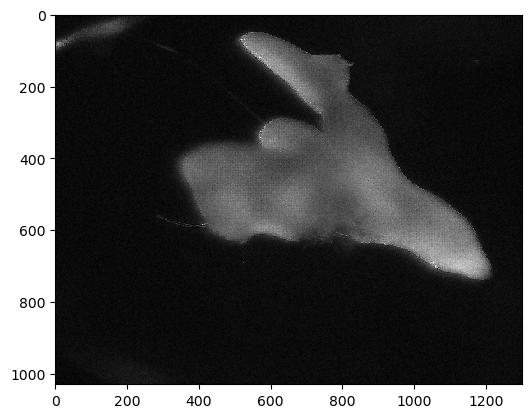

In [184]:
r_image_51 = dip.Image(r_channel_51)
g_image_51 = dip.Image(g_channel_51)
b_image_51 = dip.Image(b_channel_51)
r_image_51.Show()
g_image_51.Show()
b_image_51.Show()

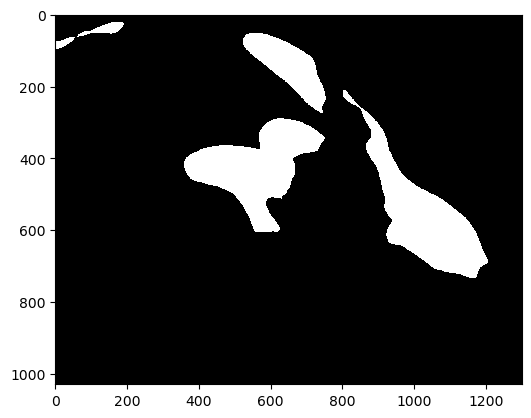

In [185]:
r_image_51_sm = dip.Gauss(r_image_51,5)
r_img_51_sm = dip.OtsuThreshold(r_image_51_sm)
r_img_51_sm.Show()

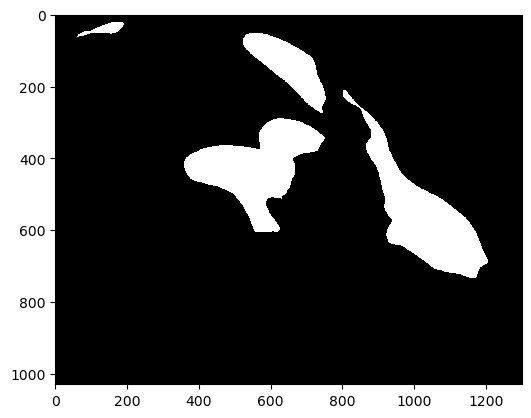

In [186]:
r_img_51_sm = dip.EdgeObjectsRemove(r_img_51_sm)
r_img_51_sm.Show()

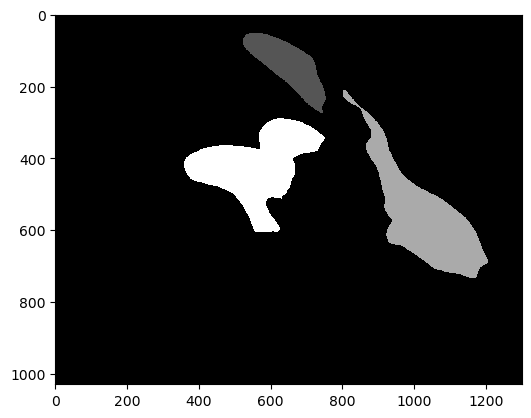

In [187]:
r_img_51_sm = dip.Label(r_img_51_sm, minSize=3000)
r_img_51_sm.Show()

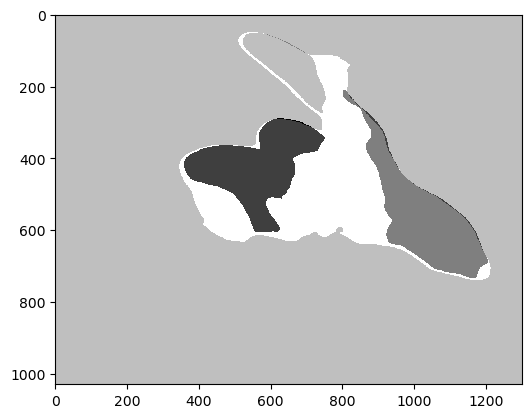

In [188]:
f = image_51_mask-r_img_51_sm
f.Show()

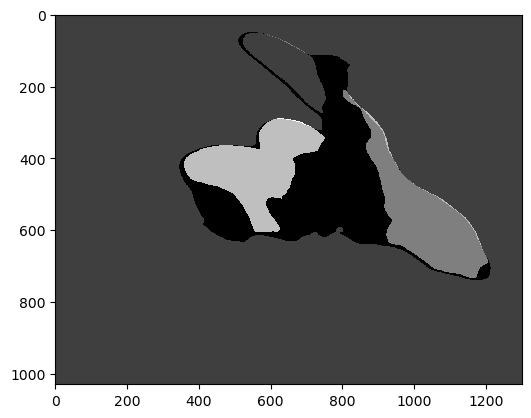

In [189]:
f = dip.Invert(f)
f.Show()

In [190]:
dip.MaximumAndMinimum(f)

(-1.0, 3.0)

In [191]:
x_seg = np.array(f)
c = 0
for i in range(1030):
    for j in range(1300):
        if x_seg[i][j]==-1:
            c=c+1

In [192]:
c

120753

In [193]:
blue_area_list[49]=c

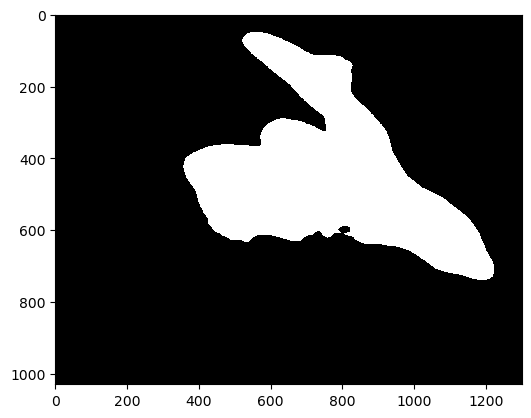

In [194]:
image_52_mask = segmentation('w8t1t2_d7_52')
image_52_mask.Show()

In [195]:
image_52 = dip.ImageRead('w8t1t2_d7_52')
img_52_meas = measurament(image_52,image_52_mask)

In [196]:
print(measurament_list[50])

  |       Size |  Perimeter |  Roundness | StandardDeviation |                                            Statistics |  SolidArea | 
- | ---------- | ---------- | ---------- | ----------------- | ----------------------------------------------------- | ---------- | 
  |            |            |            |                   |       Mean |     StdDev |   Skewness | ExcessKurtosis |            | 
  |     (px^2) |       (px) |            |                   |            |            |            |                |     (px^2) | 
- | ---------- | ---------- | ---------- | ----------------- | ---------- | ---------- | ---------- | -------------- | ---------- | 
1 |  2.546e+05 |      3045. |     0.3450 |         2.340e+07 |  2.828e+07 |  2.340e+07 |      1.424 |          2.334 |  2.546e+05 | 



In [197]:
blue_area_list[50]

1223225

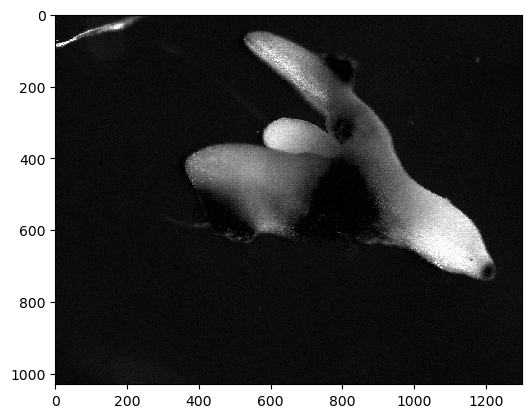

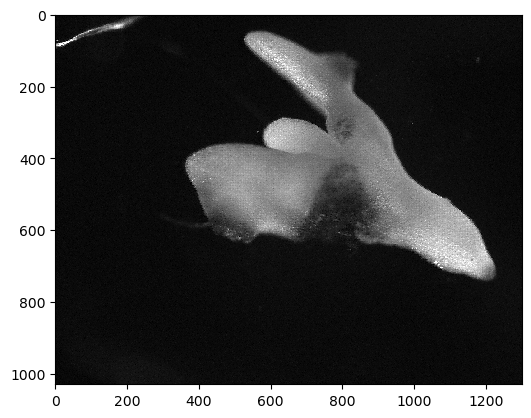

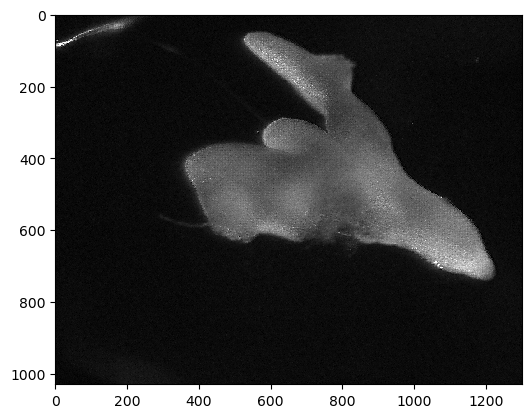

In [198]:
x_52 = np.array(image_52)
r_channel_52 = x_52[:, :, 0]
g_channel_52 = x_52[:, :, 1]
b_channel_52 = x_52[:, :, 2]




r_image_52 = dip.Image(r_channel_52)
g_image_52 = dip.Image(g_channel_52)
b_image_52 = dip.Image(b_channel_52)
r_image_52.Show()
g_image_52.Show()
b_image_52.Show()

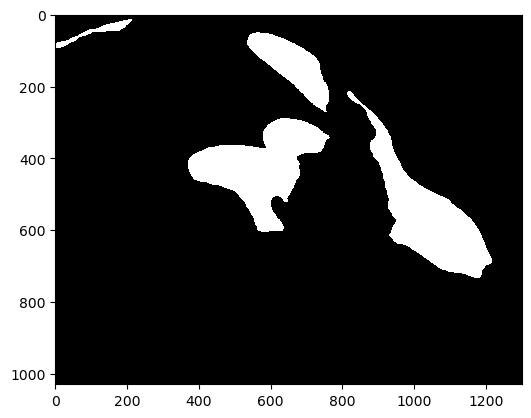

In [199]:
r_image_52_sm = dip.Gauss(r_image_52,5)
r_img_52_sm = dip.OtsuThreshold(r_image_52_sm)
r_img_52_sm.Show()

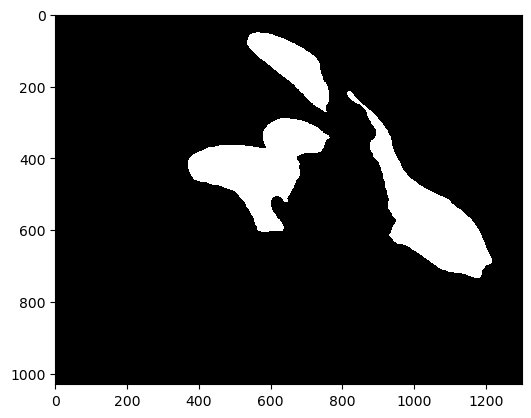

In [200]:
r_img_52_sm = dip.EdgeObjectsRemove(r_img_52_sm)
r_img_52_sm.Show()

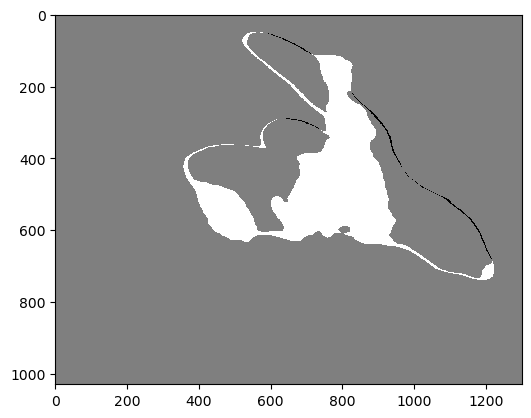

In [201]:
f = image_52_mask-r_img_52_sm
f.Show()

In [202]:
f = dip.Invert(f)

In [203]:
dip.MaximumAndMinimum(f)

(-1.0, 1.0)

In [204]:
x_seg = np.array(f)
c = 0
for i in range(1030):
    for j in range(1300):
        if x_seg[i][j]==-1:
            c=c+1

In [205]:
c

119206

In [206]:
blue_area_list[50] =c

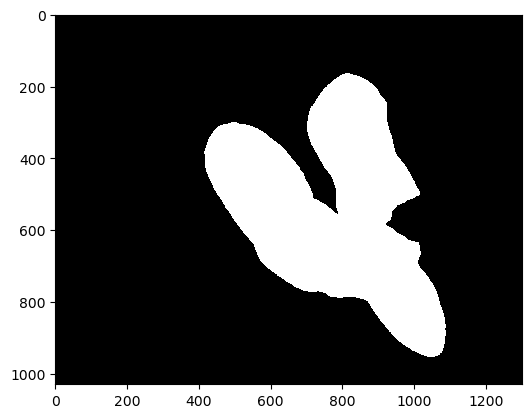

In [207]:
image_53_mask = segmentation('w8t1t2_d7_53')
image_53_mask.Show()

In [208]:
image_53 = dip.ImageRead('w8t1t2_d7_53')
img_53_meas = measurament(image_53,image_53_mask)

In [209]:
print(measurament_list[51])

  |       Size |  Perimeter |  Roundness | StandardDeviation |                                            Statistics |  SolidArea | 
- | ---------- | ---------- | ---------- | ----------------- | ----------------------------------------------------- | ---------- | 
  |            |            |            |                   |       Mean |     StdDev |   Skewness | ExcessKurtosis |            | 
  |     (px^2) |       (px) |            |                   |            |            |            |                |     (px^2) | 
- | ---------- | ---------- | ---------- | ----------------- | ---------- | ---------- | ---------- | -------------- | ---------- | 
1 |  2.604e+05 |      2945. |     0.3772 |         3.440e+07 |  4.103e+07 |  3.440e+07 |     0.8420 |        -0.3135 |  2.604e+05 | 



In [210]:
blue_area_list[51]

1247562

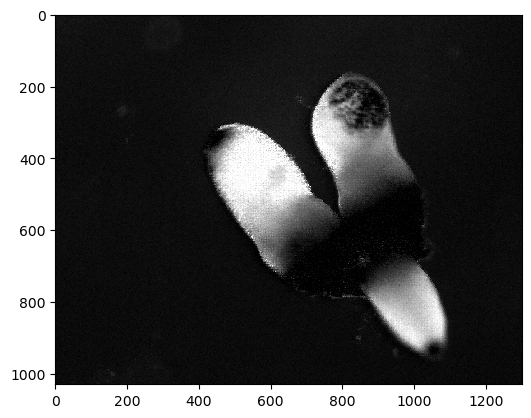

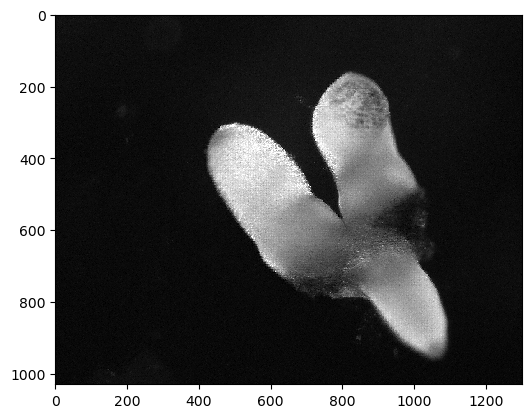

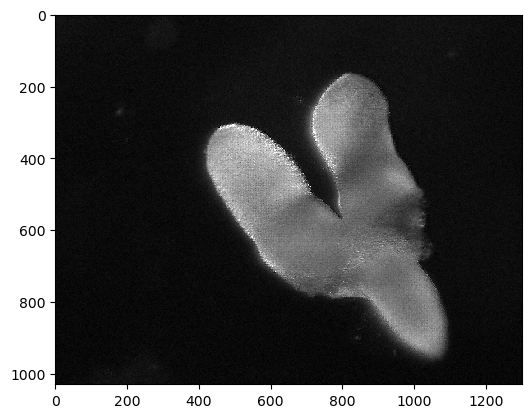

In [211]:
x_53 = np.array(image_53)
r_channel_53 = x_53[:, :, 0]
g_channel_53 = x_53[:, :, 1]
b_channel_53 = x_53[:, :, 2]

r_image_53 = dip.Image(r_channel_53)
g_image_53 = dip.Image(g_channel_53)
b_image_53 = dip.Image(b_channel_53)
r_image_53.Show()
g_image_53.Show()
b_image_53.Show()

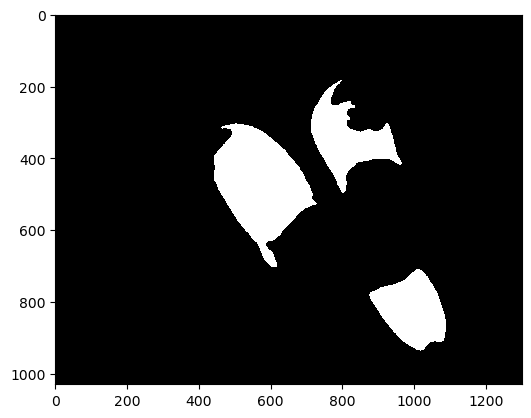

In [212]:
r_image_53_sm = dip.Gauss(r_image_53,5)
r_img_53_sm = dip.OtsuThreshold(r_image_53_sm)
r_img_53_sm.Show()

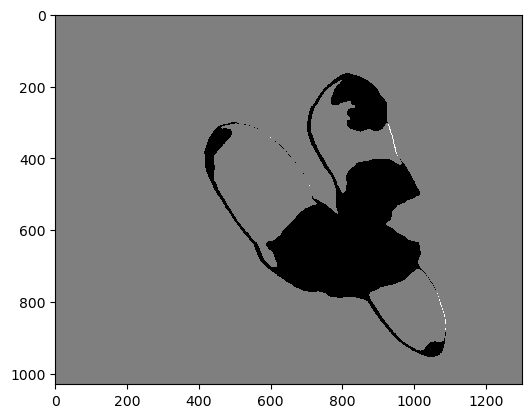

In [213]:
f = image_53_mask - r_img_53_sm
f= dip.Invert(f)
f.Show()

In [214]:
dip.MaximumAndMinimum(f)

(-1.0, 1.0)

In [215]:
x_seg = np.array(f)
c = 0
for i in range(1030):
    for j in range(1300):
        if x_seg[i][j]==-1:
            c=c+1

In [216]:
c

138201

In [217]:
blue_area_list[51] = c

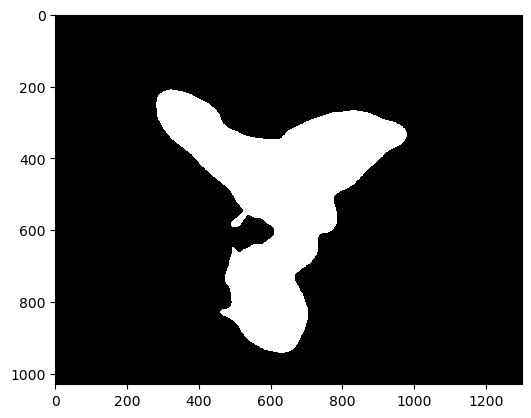

In [218]:
image_54_mask = segmentation('w8t1t2_d7_54b')
image_54_mask.Show()

In [219]:
image_54b = dip.ImageRead('w8t1t2_d7_54b')
img_54_meas = measurament(image_54b,image_54_mask)

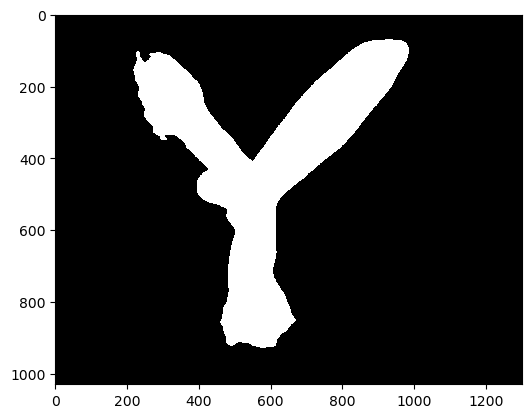

In [220]:
image_55_mask = segmentation('w8t1t2_d7_55')
image_55_mask.Show()

In [221]:
image_55 = dip.ImageRead('w8t1t2_d7_55')
img_55_meas = measurament(image_55,image_55_mask)

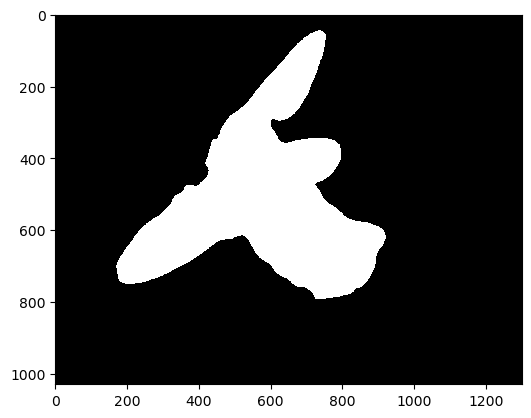

In [222]:
image_56_mask = segmentation('w8t1t2_d7_56')
image_56_mask.Show()

In [223]:
image_56 = dip.ImageRead('w8t1t2_d7_56')
img_56_meas = measurament(image_56,image_56_mask)

In [224]:
image_57= dip.ImageRead('w8t1t2_d7_57')


In [225]:
x_57=np.array(image_57)
r_channel_57 = x_57[:, :, 0]
g_channel_57 = x_57[:, :, 1]
b_channel_57 = x_57[:, :, 2]

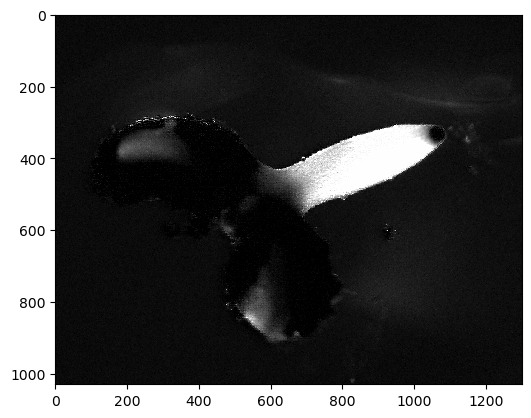

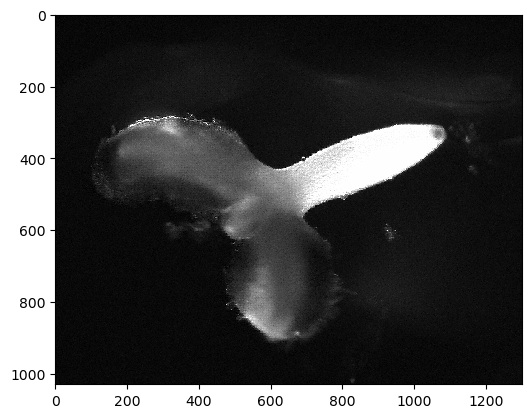

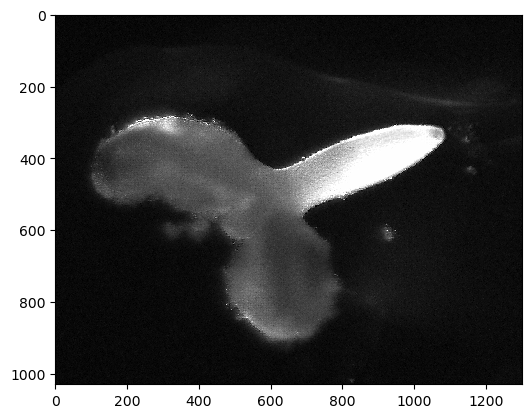

In [226]:
r_image_57 = dip.Image(r_channel_57)
g_image_57 = dip.Image(g_channel_57)
b_image_57 = dip.Image(b_channel_57)
r_image_57.Show()
g_image_57.Show()
b_image_57.Show()

In [227]:
b_image_57_m = dip.MorphologicalSharpening(b_image_57)

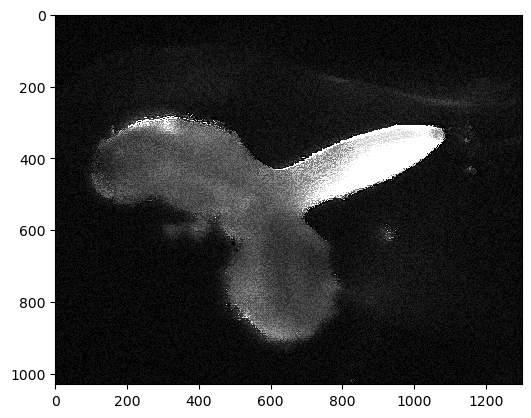

In [228]:
b_image_57_m.Show()

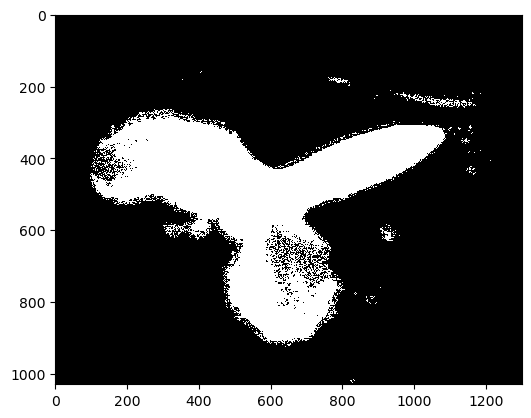

In [229]:
b = dip.BackgroundThreshold(b_image_57_m)
b.Show()

In [230]:
b= dip.FillHoles(b)

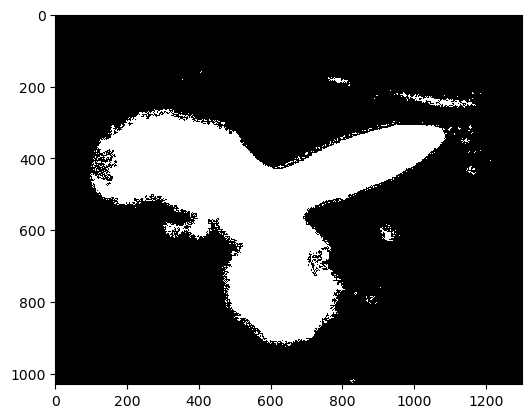

In [231]:
b.Show()

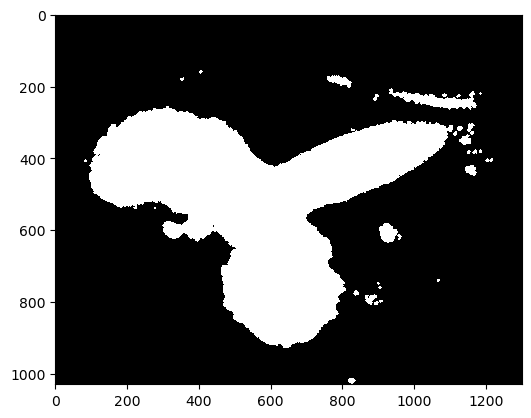

In [232]:
b = dip.Dilation(b)
b.Show()

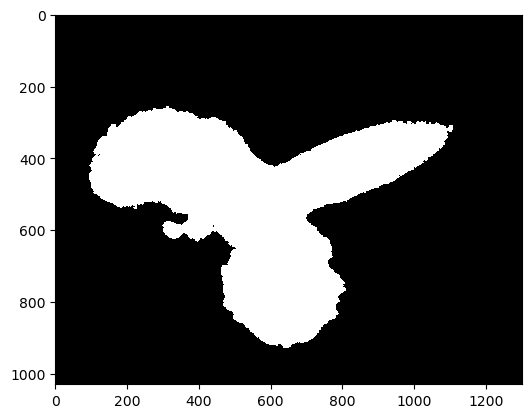

In [233]:
image_57_mask =  dip.Label(b, minSize=7000)
image_57_mask.Show()

In [234]:
mask_list.append(image_57_mask)

In [235]:

img_57_meas = measurament(image_57,image_57_mask)

In [236]:
r_image_57_sm = dip.Gauss(r_image_57,3)

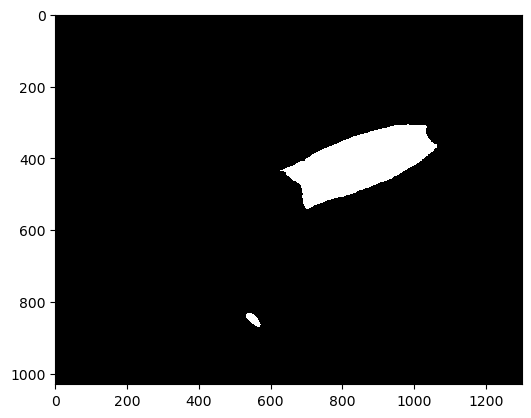

In [237]:
b_mask_57 = dip.OtsuThreshold(r_image_57_sm)
b_mask_57.Show()

In [238]:
inv_image_57_mask = dip.Invert(image_57_mask)

In [239]:
inv_b_mask_57 = dip.Invert(b_mask_57)

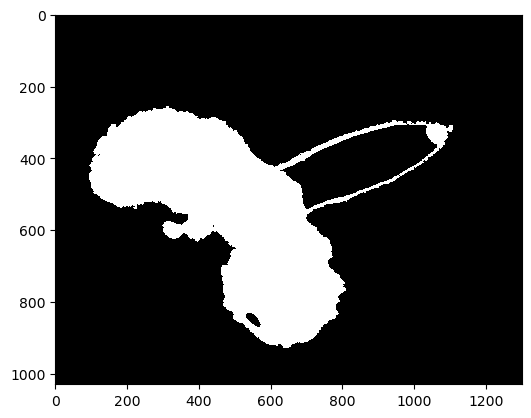

In [240]:
f = inv_image_57_mask-inv_b_mask_57
f = dip.Invert(f)
f.Show()

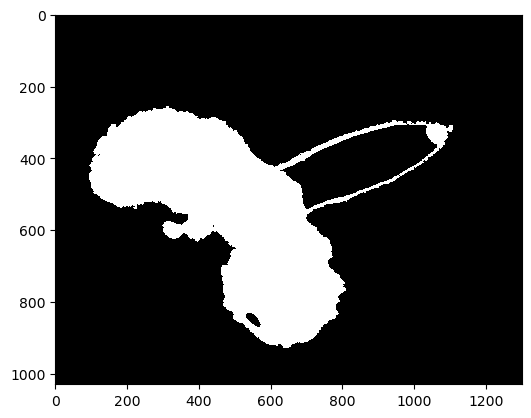

In [241]:
f = dip.OtsuThreshold(f)
f.Show()

In [242]:
x_seg = np.array(f)

In [243]:
c = 0
for i in range(1030):
    for j in range(1300):
        if x_seg[i][j]==1:
            c=c+1

In [244]:
blue_area_list.append(c)

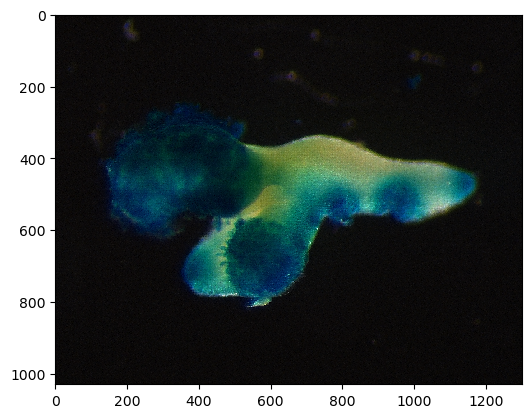

In [245]:
image_58= dip.ImageRead('w8t1t2_d7_58')
image_58.Show()

In [246]:
x_58=np.array(image_58)
r_channel_58 = x_58[:, :, 0]
g_channel_58 = x_58[:, :, 1]
b_channel_58 = x_58[:, :, 2]

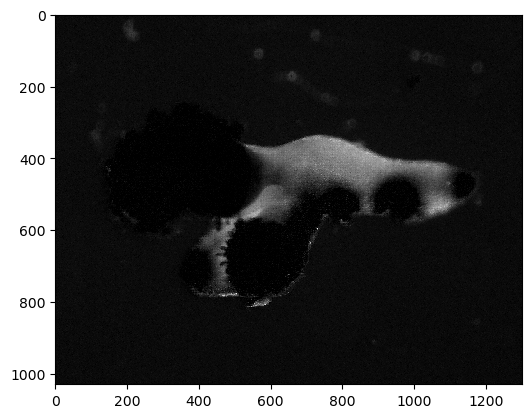

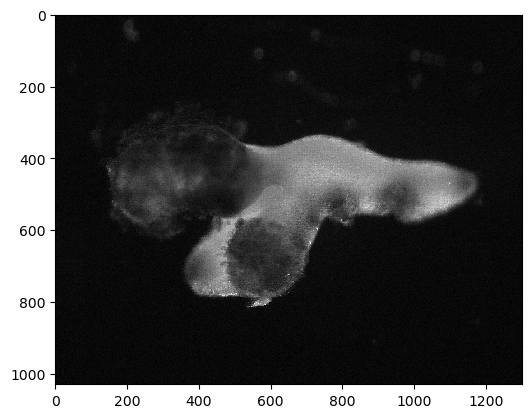

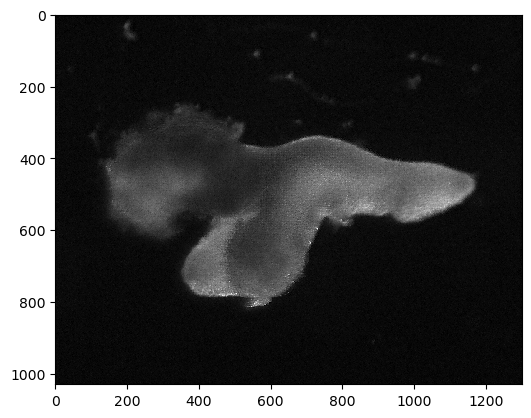

In [247]:
r_image_58 = dip.Image(r_channel_58)
g_image_58 = dip.Image(g_channel_58)
b_image_58 = dip.Image(b_channel_58)
r_image_58.Show()
g_image_58.Show()
b_image_58.Show()

In [248]:
min_b,max_b = dip.MaximumAndMinimum(b_image_58)
max_b

65535.0

In [249]:
b_image_58_sm = dip.Gauss(b_image_58,4)

In [250]:
min_b_sm,max_b_sm = dip.MaximumAndMinimum(b_image_58_sm)
max_b_sm

44031.56640625

In [251]:
x = dip.RangeThreshold(b_image_58_sm,3500.0,44588.25)

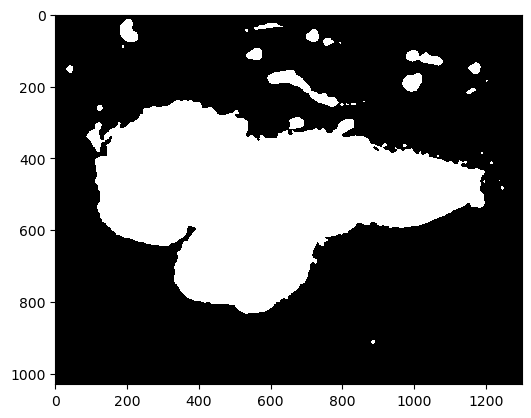

In [252]:
x.Show()

In [253]:
x = dip.FillHoles(x)

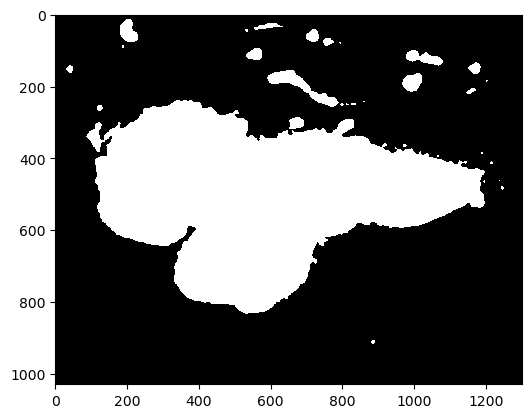

In [254]:
x.Show()

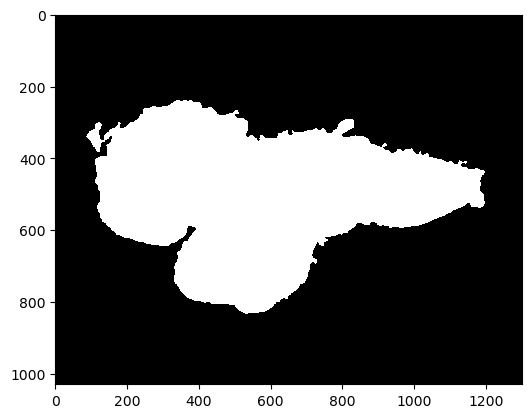

In [255]:
image_58_mask =  dip.Label(x, minSize=7000)
image_58_mask.Show()

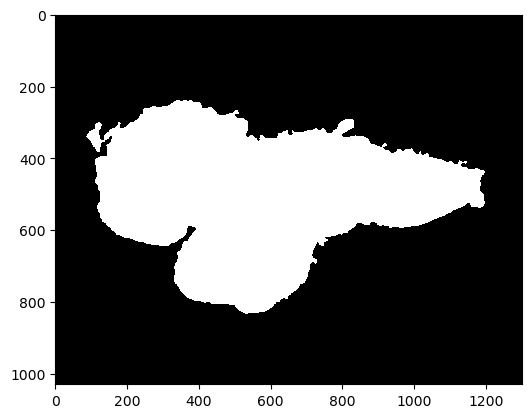

In [256]:
image_58_mask.Show()

In [257]:
img_58_meas = measurament(image_58,image_58_mask)

In [258]:
mask_list.append(image_58_mask)

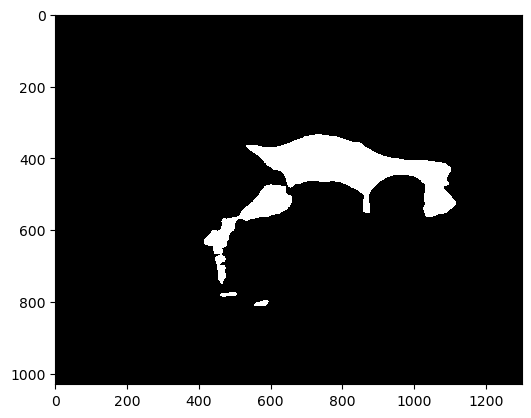

In [259]:
r_image_58_sm = dip.Gauss(r_image_58,5)
r_image_58_sm = dip.OtsuThreshold(r_image_58_sm)
r_image_58_sm.Show()

In [260]:
inv_image_58_mask = dip.Invert(image_58_mask)

In [261]:
inv_r_image_58_sm = dip.Invert(r_image_58_sm)

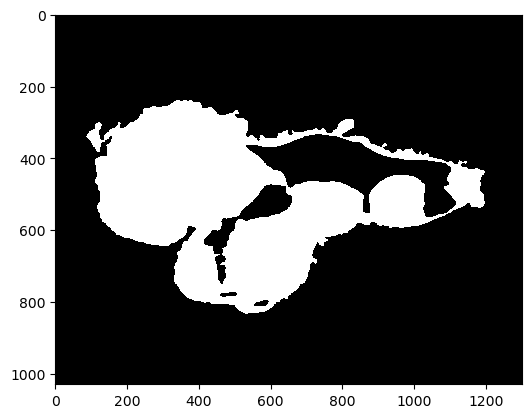

In [262]:
f = inv_image_58_mask-inv_r_image_58_sm
f = dip.Invert(f)
f = dip.OtsuThreshold(f)
f.Show()

In [263]:
x_seg = np.array(f)

In [264]:
c = 0
for i in range(1030):
    for j in range(1300):
        if x_seg[i][j]==1:
            c=c+1

In [265]:
c

291327

In [266]:
blue_area_list.append(c)

In [267]:
from PIL import Image

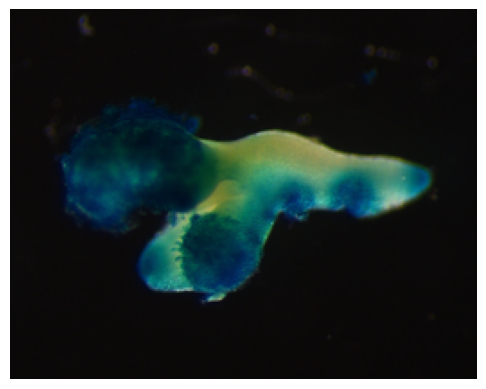

In [268]:
original_image = Image.open('w8t1t2_d7_58.tif')

# Set the new dimensions
new_width = 260
new_height = 206

# Resize the image
resized_image = original_image.resize((new_width, new_height),Image.Resampling.LANCZOS)

# Display the image
plt.imshow(resized_image)
plt.axis('off')  # Hide the axis
plt.show()

In [269]:
import os
current_directory = os.getcwd()

In [270]:
current_directory 

'C:\\Users\\Simone\\Desktop\\ImageAnalysis\\image_analysis_labs\\2023 Assignment05Images'

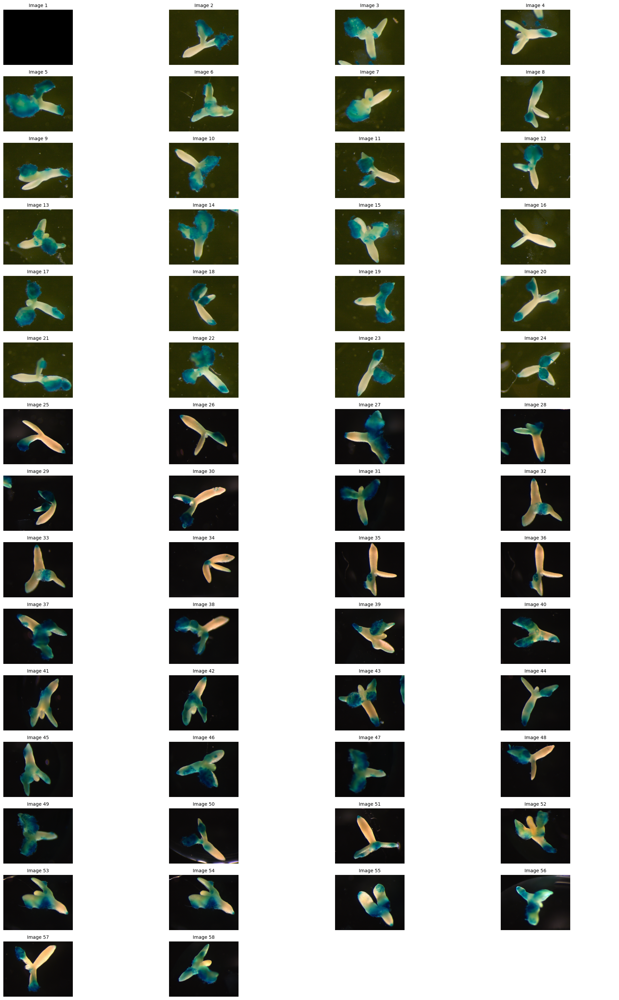

In [271]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Function to resize an image
def resize_image(image_path, new_width, new_height):
    image = Image.open(image_path)
    resized_image = image.resize((new_width, new_height))
    return resized_image

# Paths to your images
image_folder = "C:\\Users\\Simone\\Desktop\\ImageAnalysis\\image_analysis_labs\\2023 Assignment05Images"
image_paths = [os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith(('tif'))]

# Ensure there are 58 images
image_paths = image_paths[:58]

# Resize dimensions
new_width = 260
new_height = 206

# Resize all images
resized_images = [resize_image(image_path, new_width, new_height) for image_path in image_paths]

# Display images in a panel with 15 rows and 4 columns
fig, axes = plt.subplots(15, 4, figsize=(20, 30))  # Adjust figsize as necessary

# Flatten axes array for easy iteration
axes = axes.flatten()

for i, (ax, img) in enumerate(zip(axes, resized_images)):
    ax.imshow(img)
    ax.axis('off')  # Hide the axes
    ax.set_title(f"Image {i+1}", fontsize=10)

# Hide any remaining empty subplots
for ax in axes[len(resized_images):]:
    ax.axis('off')

plt.tight_layout()
plt.show()

In [272]:
mask_list

[<Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar image, UINT32, sizes {1300, 1030}>,
 <Scalar i

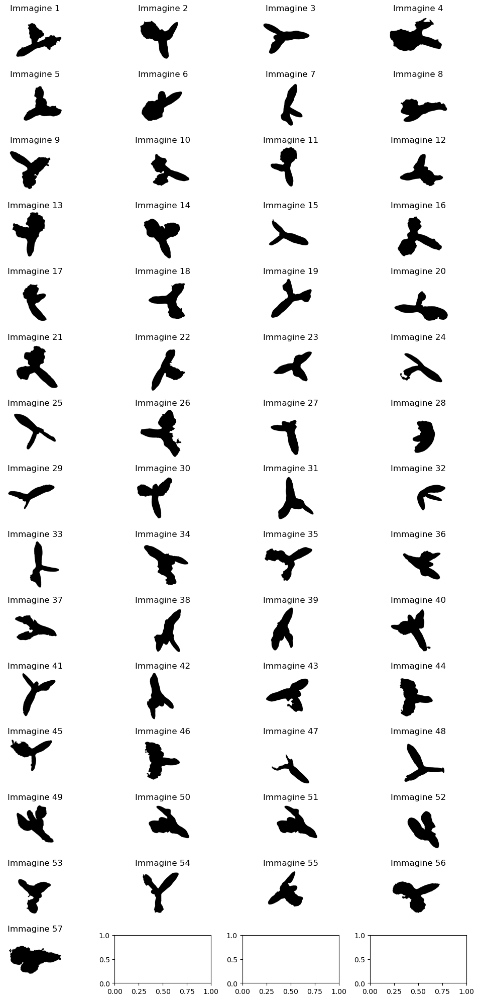

In [273]:
fig, axs = plt.subplots(15, 4, figsize=(10, 20))

# Appiattire l'oggetto asse per accedere facilmente a ciascun subplot
axs = axs.flatten()

# Loop attraverso ciascuna immagine e tracciarla
for i in range(len(mask_list)):
    axs[i].imshow(mask_list[i], cmap='binary')  # Assumendo che le immagini binarie siano in scala di grigi
    axs[i].axis('off')  # Disattiva gli assi
    axs[i].set_title(f'Immagine {i+1}')  # Imposta il titolo se necessario

# Regola il layout
plt.tight_layout()
plt.show()

In [274]:
size_c = []
perim_c = []
roundness_c = []
std = []
skew=[]
kurtosis = []
for i in range(len(measurament_list)):
    line = measurament_list[i]
    size = line["Size"][1][0]
    size_c.append(size)
    perim=line["Perimeter"][1][0]
    perim_c.append(perim)
    rounde = line["Roundness"][1][0]
    stand_dev = line['StandardDeviation'][1][0]
    roundness_c.append(rounde)
    std.append(stand_dev)
    skew_v = line["Statistics"][1][2]
    skew.append(skew_v)
    kurtosis_v = line["Statistics"][1][3]
    kurtosis.append(kurtosis_v)

In [275]:
measurament_df = pd.DataFrame({'Size':size_c , 'Perimeter': perim_c, 'Roundness':roundness_c,"Std_dev":std,"Absolute Area":blue_area_list,
                              "Skewness":skew,"Kurtosis":kurtosis})

In [276]:
measurament_df.head(20)

,Size,Perimeter,Roundness,Std_dev,Absolute Area,Skewness,Kurtosis
0,244696.0,3515.681593,0.248781,2.839331e+07,145677,0.727386,-0.714266
1,276957.0,3012.005593,0.383628,2.177180e+07,135640,0.106981,-1.181606
2,216643.0,2956.283593,0.311503,2.622624e+07,59598,-0.285303,-0.689619
3,388905.0,3960.289593,0.311601,1.690321e+07,328329,1.658942,2.452513
4,227141.0,2713.071593,0.387778,1.830999e+07,71990,0.196090,-0.114183
5,259896.0,2573.958593,0.492954,2.480600e+07,118251,0.401105,-0.654720
6,170509.0,2590.475593,0.319299,2.434325e+07,68411,0.405117,-0.058724
7,253603.0,2912.679593,0.375646,2.798613e+07,110933,0.259579,-1.003590
8,266183.0,3275.232593,0.311821,2.537930e+07,195388,1.083102,-0.065250
9,220838.0,3069.990593,0.294449,2.625032e+07,148922,0.873913,-0.400973


In [277]:
measurament_df["Relative Area"] = np.array(blue_area_list)/np.array(size_c)

In [278]:
measurament_df

,Size,Perimeter,Roundness,Std_dev,Absolute Area,Skewness,Kurtosis,Relative Area
0,244696.0,3515.681593,0.248781,2.839331e+07,145677,0.727386,-0.714266,0.595339
1,276957.0,3012.005593,0.383628,2.177180e+07,135640,0.106981,-1.181606,0.489751
2,216643.0,2956.283593,0.311503,2.622624e+07,59598,-0.285303,-0.689619,0.275098
3,388905.0,3960.289593,0.311601,1.690321e+07,328329,1.658942,2.452513,0.844240
4,227141.0,2713.071593,0.387778,1.830999e+07,71990,0.196090,-0.114183,0.316940
5,259896.0,2573.958593,0.492954,2.480600e+07,118251,0.401105,-0.654720,0.454994
6,170509.0,2590.475593,0.319299,2.434325e+07,68411,0.405117,-0.058724,0.401216
7,253603.0,2912.679593,0.375646,2.798613e+07,110933,0.259579,-1.003590,0.437428
8,266183.0,3275.232593,0.311821,2.537930e+07,195388,1.083102,-0.065250,0.734036
9,220838.0,3069.990593,0.294449,2.625032e+07,148922,0.873913,-0.400973,0.674350


For each image i have now information on the Size of the embryo, its perimeter and roundness.
We also have information on the expression of the target gene as absolute area (total amount of blue pixels) and relative area
(total amount of blue pixels/size of the embrio).

# Visual representation of the data

Text(0, 0.5, 'Perimeter')

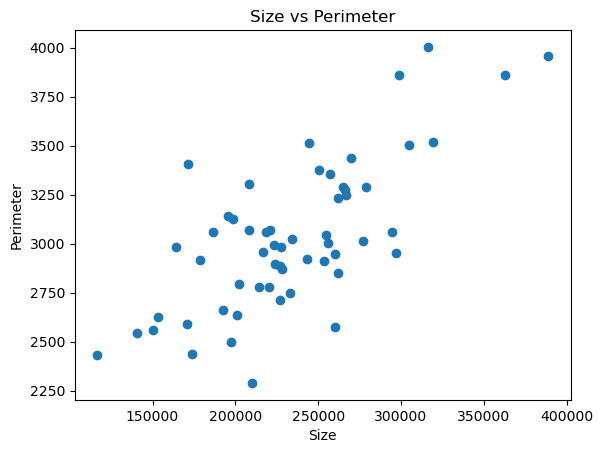

In [279]:
x = measurament_df["Size"]
y = measurament_df["Perimeter"]
plt.scatter(x,y)
plt.title('Size vs Perimeter')
plt.xlabel('Size')
plt.ylabel('Perimeter')

Text(0, 0.5, 'Roundness')

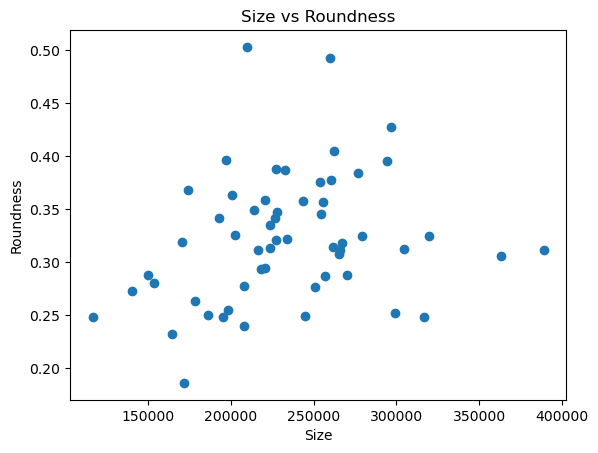

In [280]:
y = measurament_df["Roundness"]
plt.scatter(x,y)
plt.title('Size vs Roundness')
plt.xlabel('Size')
plt.ylabel('Roundness')

Text(0, 0.5, 'Perimeter')

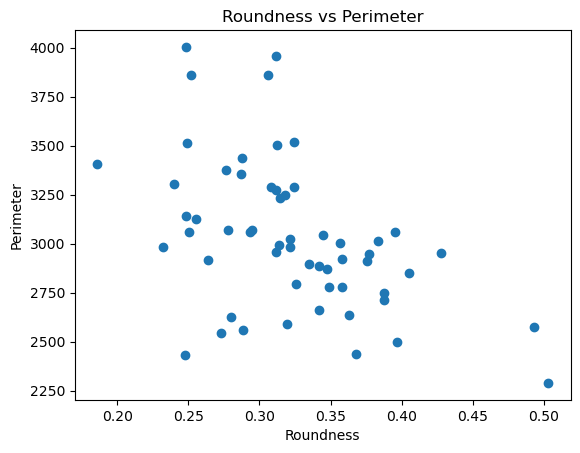

In [281]:
x = measurament_df["Roundness"]
y = measurament_df["Perimeter"]
plt.scatter(x,y)
plt.title('Roundness vs Perimeter')
plt.xlabel('Roundness')
plt.ylabel('Perimeter')

Text(0, 0.5, 'Relative Area')

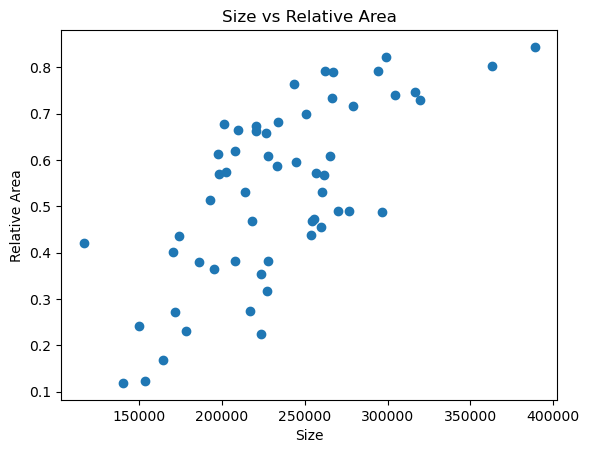

In [282]:
x = measurament_df["Size"]
y = measurament_df["Relative Area"]
plt.scatter(x,y)
plt.title('Size vs Relative Area')
plt.xlabel('Size')
plt.ylabel('Relative Area')

Text(0, 0.5, 'Relative Area')

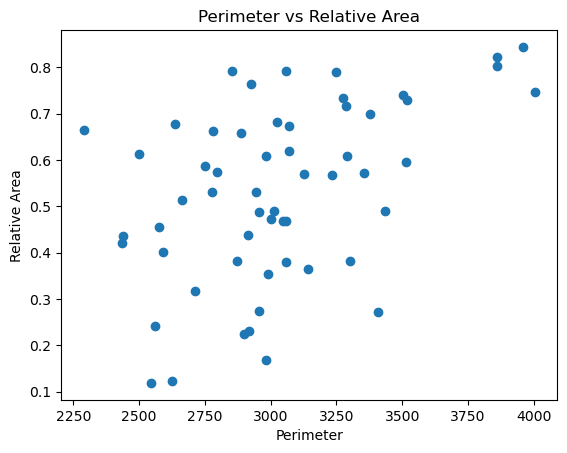

In [283]:
x = measurament_df["Perimeter"]
y = measurament_df["Relative Area"]
plt.scatter(x,y)
plt.title('Perimeter vs Relative Area')
plt.xlabel('Perimeter')
plt.ylabel('Relative Area')

Text(0, 0.5, 'Relative Area')

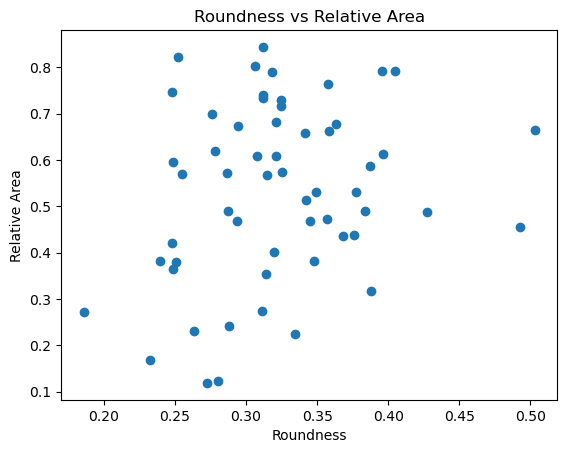

In [284]:
x = measurament_df["Roundness"]
y = measurament_df["Relative Area"]
plt.scatter(x,y)
plt.title('Roundness vs Relative Area')
plt.xlabel('Roundness')
plt.ylabel('Relative Area')

Text(0, 0.5, 'Standard Deviation')

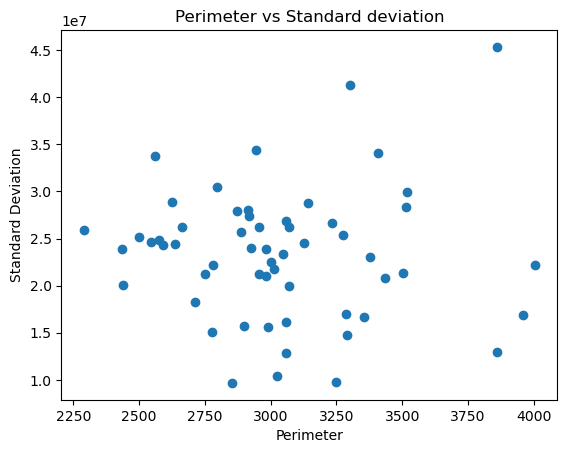

In [285]:
x = measurament_df["Perimeter"]
y = measurament_df["Std_dev"]
plt.scatter(x,y)
plt.title('Perimeter vs Standard deviation')
plt.xlabel('Perimeter')
plt.ylabel('Standard Deviation')

Text(0, 0.5, 'Standard Deviation')

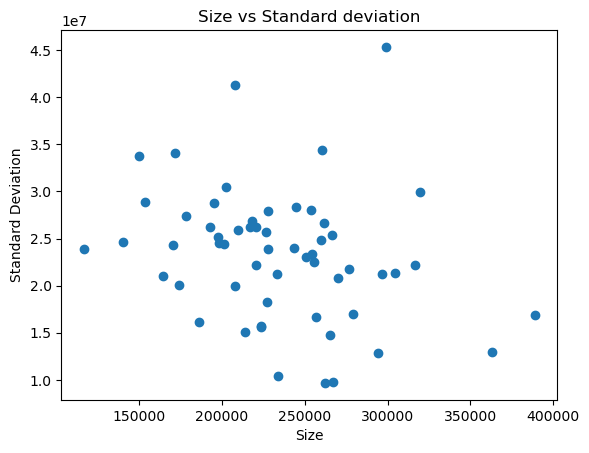

In [286]:
x = measurament_df["Size"]
y = measurament_df["Std_dev"]
plt.scatter(x,y)
plt.title('Size vs Standard deviation')
plt.xlabel('Size')
plt.ylabel('Standard Deviation')

Text(0, 0.5, 'Standard Deviation')

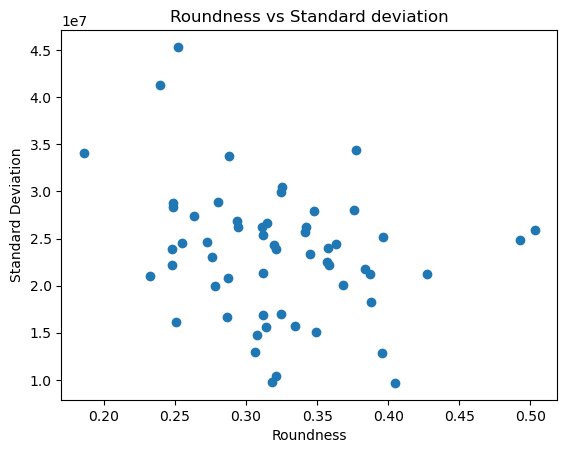

In [287]:
x = measurament_df["Roundness"]
y = measurament_df["Std_dev"]
plt.scatter(x,y)
plt.title('Roundness vs Standard deviation')
plt.xlabel('Roundness')
plt.ylabel('Standard Deviation')

Text(0, 0.5, 'Standard Deviation')

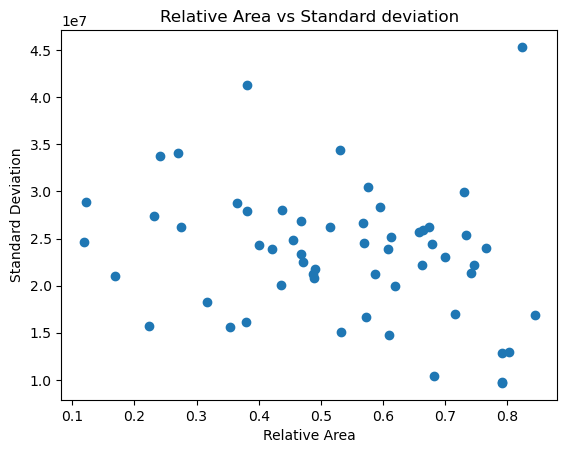

In [288]:
x = measurament_df["Relative Area"]
y = measurament_df["Std_dev"]
plt.scatter(x,y)
plt.title('Relative Area vs Standard deviation')
plt.xlabel('Relative Area')
plt.ylabel('Standard Deviation')

Text(0, 0.5, 'Skewness')

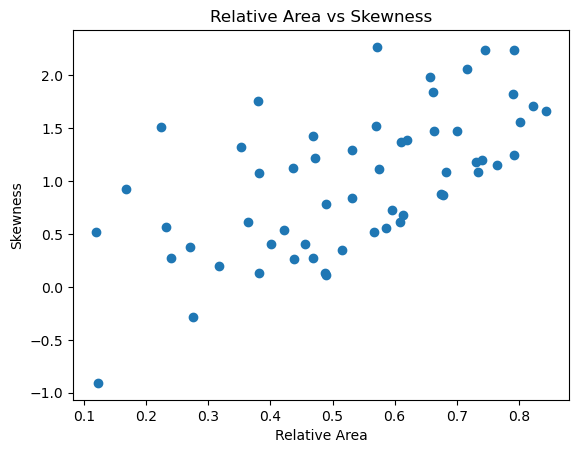

In [324]:
x = measurament_df["Relative Area"]
y = measurament_df["Skewness"]
plt.scatter(x,y)
plt.title('Relative Area vs Skewness')
plt.xlabel('Relative Area')
plt.ylabel('Skewness')

Text(0, 0.5, 'Skewness')

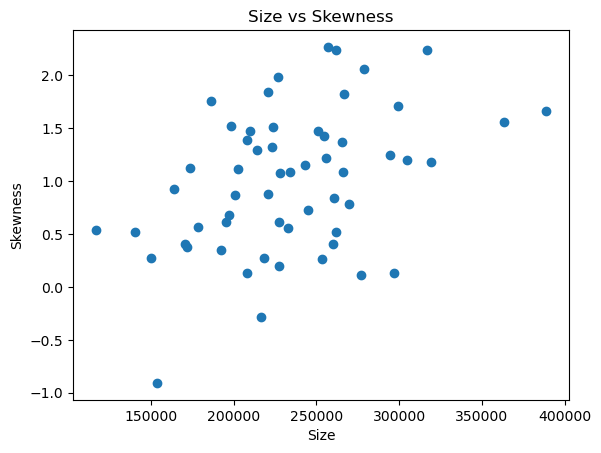

In [325]:
x = measurament_df["Size"]
y = measurament_df["Skewness"]
plt.scatter(x,y)
plt.title('Size vs Skewness')
plt.xlabel('Size')
plt.ylabel('Skewness')

Text(0, 0.5, 'Skewness')

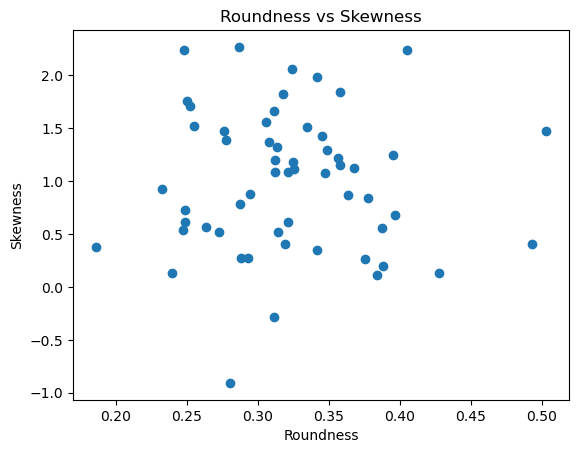

In [326]:
x = measurament_df["Roundness"]
y = measurament_df["Skewness"]
plt.scatter(x,y)
plt.title('Roundness vs Skewness')
plt.xlabel('Roundness')
plt.ylabel('Skewness')

Text(0, 0.5, 'Kurtosis')

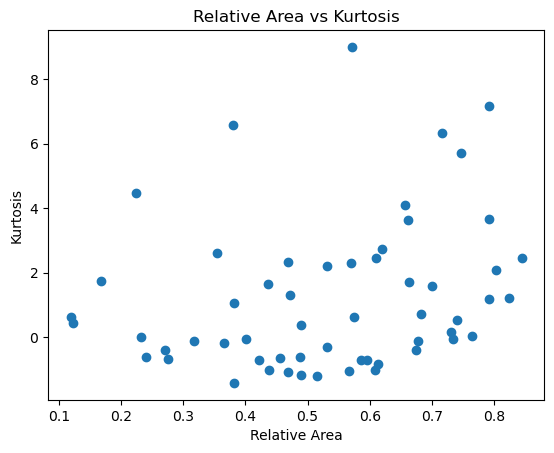

In [327]:
x = measurament_df["Relative Area"]
y = measurament_df["Kurtosis"]
plt.scatter(x,y)
plt.title('Relative Area vs Kurtosis')
plt.xlabel('Relative Area')
plt.ylabel('Kurtosis')

In [289]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


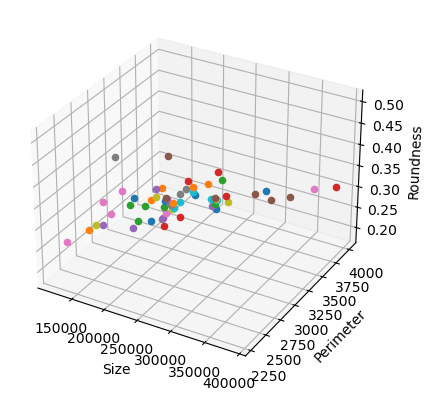

In [290]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Itera su ogni riga del DataFrame
for index, row in measurament_df.iterrows():
    # Estrai i valori di ciascuna riga
    x, y, z = row['Size'], row['Perimeter'], row['Roundness']
    # Disegna un punto nel grafico 3D per ogni riga
    ax.scatter(x, y, z)

# Etichetta gli assi
ax.set_xlabel('Size')
ax.set_ylabel('Perimeter')
ax.set_zlabel('Roundness')

# Mostra il grafico
plt.show()

In [291]:
len(blue_area_list)

57

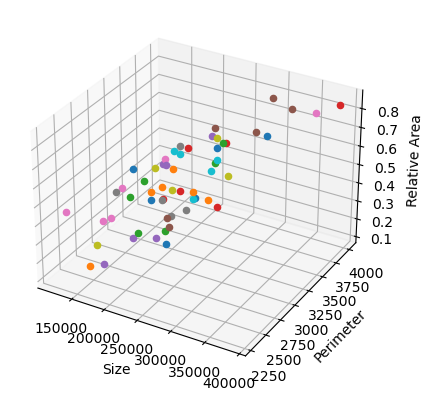

In [292]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Itera su ogni riga del DataFrame
for index, row in measurament_df.iterrows():
    # Estrai i valori di ciascuna riga
    x, y, z = row['Size'], row['Perimeter'], row['Relative Area']
    # Disegna un punto nel grafico 3D per ogni riga
    ax.scatter(x, y, z)

# Etichetta gli assi
ax.set_xlabel('Size')
ax.set_ylabel('Perimeter')
ax.set_zlabel('Relative Area')

# Mostra il grafico
plt.show()

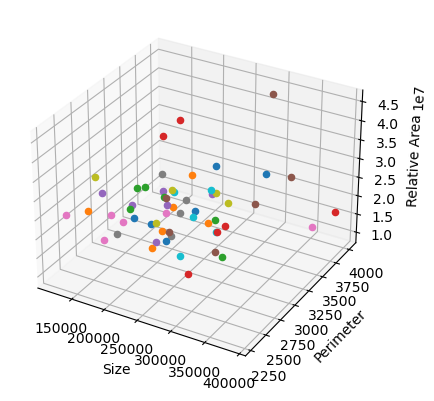

In [293]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Itera su ogni riga del DataFrame
for index, row in measurament_df.iterrows():
    # Estrai i valori di ciascuna riga
    x, y, z = row['Size'], row['Perimeter'], row['Std_dev']
    # Disegna un punto nel grafico 3D per ogni riga
    ax.scatter(x, y, z)

# Etichetta gli assi
ax.set_xlabel('Size')
ax.set_ylabel('Perimeter')
ax.set_zlabel('Relative Area')

# Mostra il grafico
plt.show()

We now want to find groups inside our embryos, this is a task of unsupervised learning called clustering.
First we try with K-means because it  works well with data living in an euclidean space and it is very easy to tune in the
number of groups that we wish to find

In [294]:
import sklearn
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

We need to normalize the data because they are of different orders of magnitude

In [295]:
x = measurament_df.loc[:,:].values

In [296]:
x = StandardScaler().fit_transform(x)

In [297]:
kmeans_pca_compl = KMeans(3,init='k-means++',random_state=42)

In [298]:
kmeans_pca_compl.fit(x)

C:\Simone\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


KMeans(n_clusters=3, random_state=42)

In [299]:
pred_labels_compl = kmeans_pca_compl.labels_

In [300]:
measurament_df["label"] = pred_labels_compl

In [301]:
measurament_df

,Size,Perimeter,Roundness,Std_dev,Absolute Area,Skewness,Kurtosis,Relative Area,label
0,244696.0,3515.681593,0.248781,2.839331e+07,145677,0.727386,-0.714266,0.595339,0
1,276957.0,3012.005593,0.383628,2.177180e+07,135640,0.106981,-1.181606,0.489751,0
2,216643.0,2956.283593,0.311503,2.622624e+07,59598,-0.285303,-0.689619,0.275098,0
3,388905.0,3960.289593,0.311601,1.690321e+07,328329,1.658942,2.452513,0.844240,2
4,227141.0,2713.071593,0.387778,1.830999e+07,71990,0.196090,-0.114183,0.316940,0
5,259896.0,2573.958593,0.492954,2.480600e+07,118251,0.401105,-0.654720,0.454994,0
6,170509.0,2590.475593,0.319299,2.434325e+07,68411,0.405117,-0.058724,0.401216,0
7,253603.0,2912.679593,0.375646,2.798613e+07,110933,0.259579,-1.003590,0.437428,0
8,266183.0,3275.232593,0.311821,2.537930e+07,195388,1.083102,-0.065250,0.734036,2
9,220838.0,3069.990593,0.294449,2.625032e+07,148922,0.873913,-0.400973,0.674350,0


We now plot the Roundness and relative area of each embryo, coloring with the same color points that belong to the same cluster

In [302]:
import seaborn as sns

<AxesSubplot:xlabel='Relative Area', ylabel='Roundness'>

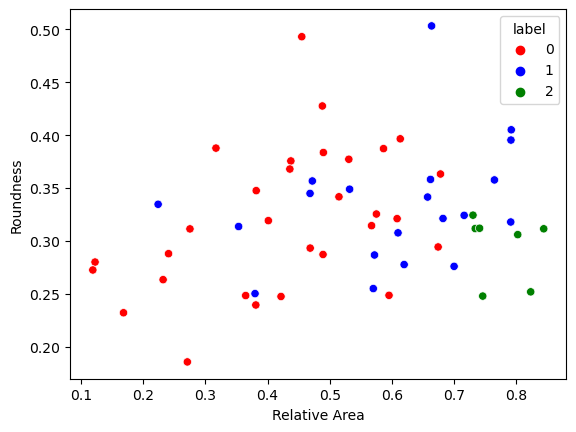

In [303]:
sns.scatterplot(data=measurament_df,x="Relative Area",y="Roundness",hue="label",palette = ["red", "blue", "green"])

<AxesSubplot:xlabel='Relative Area', ylabel='Perimeter'>

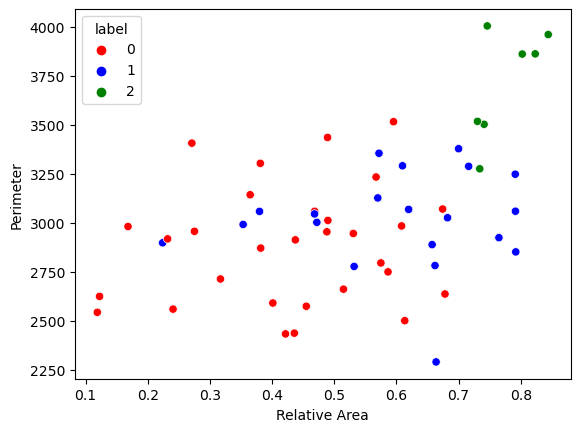

In [304]:
sns.scatterplot(data=measurament_df,x="Relative Area",y="Perimeter",hue="label",palette = ["red", "blue", "green"])

<AxesSubplot:xlabel='Roundness', ylabel='Kurtosis'>

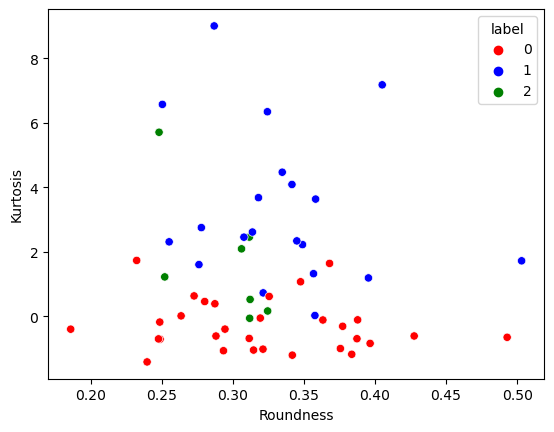

In [328]:
sns.scatterplot(data=measurament_df,x="Roundness",y="Kurtosis",hue="label",palette = ["red", "blue", "green"])

<AxesSubplot:xlabel='Relative Area', ylabel='Skewness'>

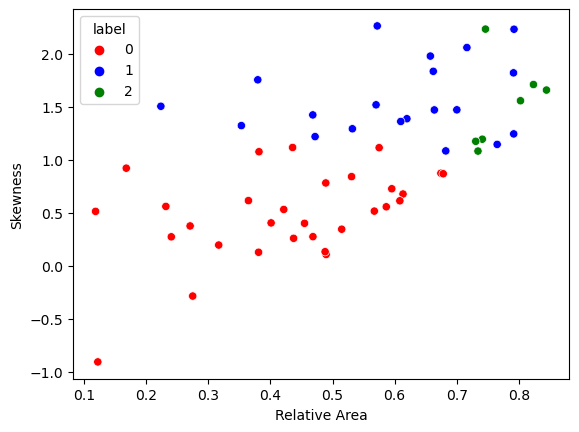

In [329]:
sns.scatterplot(data=measurament_df,x="Relative Area",y="Skewness",hue="label",palette = ["red", "blue", "green"])

<AxesSubplot:xlabel='Skewness', ylabel='Kurtosis'>

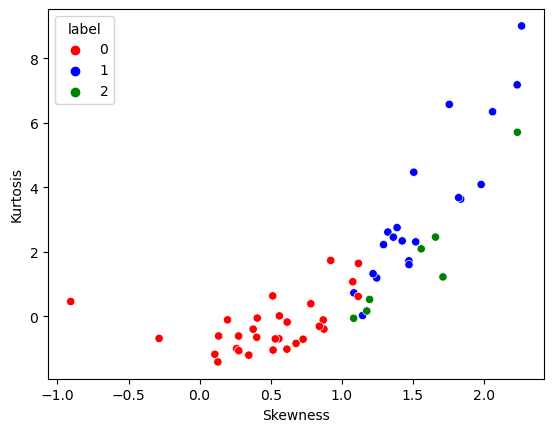

In [330]:
sns.scatterplot(data=measurament_df,x="Skewness",y="Kurtosis",hue="label",palette = ["red", "blue", "green"])

We try with another clustering algorithm, based on euclidean distances and that allows us to obtain clustering with n groups, where
n is the number of data points to 1 big cluster containing all the data points.
It is more time consuming than K-means but it tends to be less subject to the initialization step, making it more robust in the performance


In [305]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

In [306]:
hierarchical_cluster = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='ward')

In [307]:
pred_labels = hierarchical_cluster.fit_predict(x)

In [308]:
measurament_df["labels_h"] = pred_labels

<AxesSubplot:xlabel='Relative Area', ylabel='Roundness'>

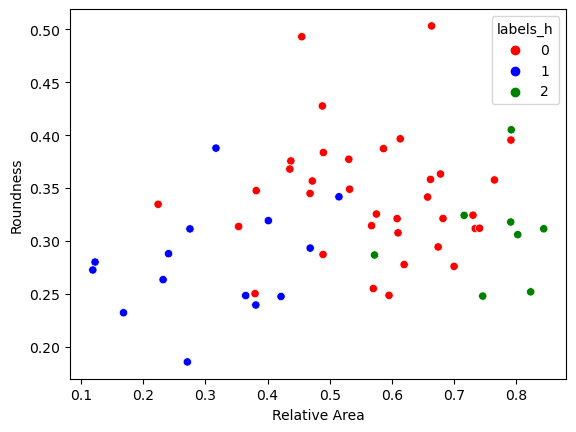

In [309]:
sns.scatterplot(data=measurament_df,x="Relative Area",y="Roundness",hue="labels_h",palette = ["red", "blue", "green"])

<AxesSubplot:xlabel='Relative Area', ylabel='Perimeter'>

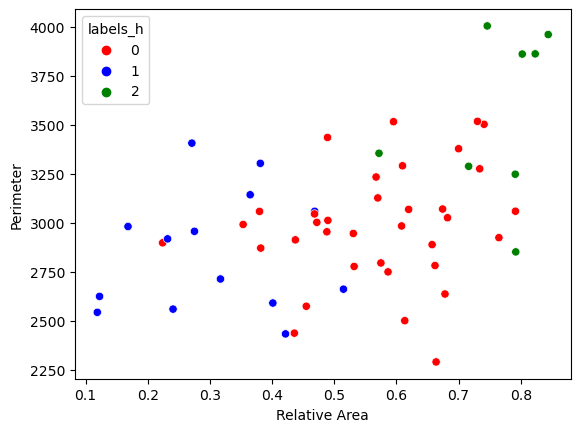

In [310]:
sns.scatterplot(data=measurament_df,x="Relative Area",y="Perimeter",hue="labels_h",palette = ["red", "blue", "green"])

<AxesSubplot:xlabel='Roundness', ylabel='Kurtosis'>

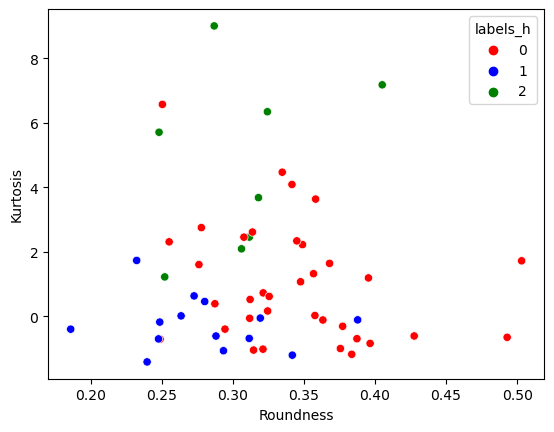

In [331]:
sns.scatterplot(data=measurament_df,x="Roundness",y="Kurtosis",hue="labels_h",palette = ["red", "blue", "green"])

<AxesSubplot:xlabel='Relative Area', ylabel='Skewness'>

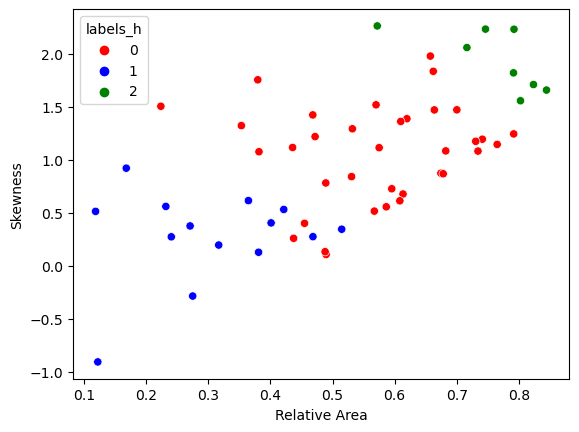

In [332]:
sns.scatterplot(data=measurament_df,x="Relative Area",y="Skewness",hue="labels_h",palette = ["red", "blue", "green"])

With hierarchical clustering we obtain more balanced groups

In [311]:
from skimage.io import imread
from skimage.feature import hog
import matplotlib.pyplot as plt

In [312]:
l_hog_16 = []

In [313]:
l_hog_64 = []

In [314]:
def hog_16(img_mask):
    v, hog_image = hog(img_mask, orientations=8, pixels_per_cell=(16, 16),
cells_per_block=(1, 1), visualize=True, multichannel=False)
    l_hog_16.append(v)

In [315]:
def hog_64(img_mask):
    v, hog_image = hog(img_mask, orientations=8, pixels_per_cell=(64, 64),
cells_per_block=(1, 1), visualize=True, multichannel=False)
    l_hog_64.append(v)

In [316]:
v_1 = hog_16(image_1_mask)

C:\Users\Simone\AppData\Local\Temp\ipykernel_8504\2146467365.py:2: FutureWarning: `multichannel` is a deprecated argument name for `hog`. It will be removed in version 1.0. Please use `channel_axis` instead.
  v, hog_image = hog(img_mask, orientations=8, pixels_per_cell=(16, 16),


In [317]:
sum(l_hog_16[0]!=0)

613

In [318]:
v_1 = hog_64(image_1_mask)

C:\Users\Simone\AppData\Local\Temp\ipykernel_8504\1631093599.py:2: FutureWarning: `multichannel` is a deprecated argument name for `hog`. It will be removed in version 1.0. Please use `channel_axis` instead.
  v, hog_image = hog(img_mask, orientations=8, pixels_per_cell=(64, 64),


In [319]:
sum(l_hog_64[0]!=0)

198

In [320]:
v, hog_image = hog(image_2, orientations=8, pixels_per_cell=(64, 64),
cells_per_block=(1, 1), visualize=True, multichannel=True)

C:\Users\Simone\AppData\Local\Temp\ipykernel_8504\1727847706.py:1: FutureWarning: `multichannel` is a deprecated argument name for `hog`. It will be removed in version 1.0. Please use `channel_axis` instead.
  v, hog_image = hog(image_2, orientations=8, pixels_per_cell=(64, 64),


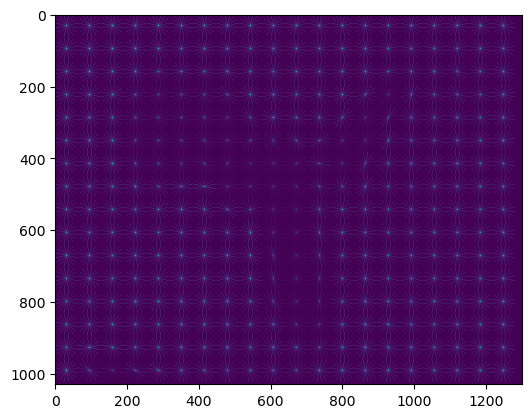

In [321]:
plt.imshow(hog_image)
plt.show()


In [322]:
v_3, hog_image = hog(image_3, orientations=8, pixels_per_cell=(64, 64),
cells_per_block=(1, 1), visualize=True, multichannel=True)

C:\Users\Simone\AppData\Local\Temp\ipykernel_8504\4270685510.py:1: FutureWarning: `multichannel` is a deprecated argument name for `hog`. It will be removed in version 1.0. Please use `channel_axis` instead.
  v_3, hog_image = hog(image_3, orientations=8, pixels_per_cell=(64, 64),


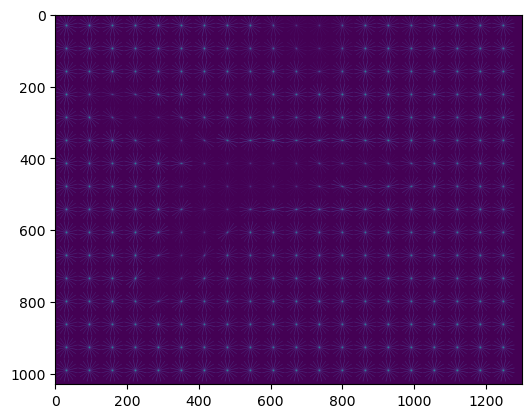

In [323]:
plt.imshow(hog_image)
plt.show()